Images on the dataset can vary their sizes, change to the same size of w = 640, h = 480

In [3]:
import os
import cv2

input_folder = './images/img'
output_folder = './images/img_same_size'

if not os.path.exists(output_folder):
    os.makedirs(output_folder)

new_size = (640, 480) # w = 640, h = 480

for filename in os.listdir(input_folder):
    input_file = os.path.join(input_folder, filename)

    if filename.endswith(('.png', '.jpg', '.jpeg', '.bmp', '.tiff')):
        image = cv2.imread(input_file)

        resized_image = cv2.resize(image, new_size)
        output_file = os.path.join(output_folder, filename)
        cv2.imwrite(output_file, resized_image)

        print(f"Resized and saved: {output_file}")

Resized and saved: ./images/img_same_size\ccrack20.jpg
Resized and saved: ./images/img_same_size\crack1.jpg
Resized and saved: ./images/img_same_size\crack10.jpg
Resized and saved: ./images/img_same_size\crack11.jpg
Resized and saved: ./images/img_same_size\crack12.jpg
Resized and saved: ./images/img_same_size\crack13.jpg
Resized and saved: ./images/img_same_size\crack14.jpg
Resized and saved: ./images/img_same_size\crack15.jpg
Resized and saved: ./images/img_same_size\crack16.jpg
Resized and saved: ./images/img_same_size\crack17.jpg
Resized and saved: ./images/img_same_size\crack18.jpg
Resized and saved: ./images/img_same_size\crack19.jpg
Resized and saved: ./images/img_same_size\crack2.jpg
Resized and saved: ./images/img_same_size\crack3.jpg
Resized and saved: ./images/img_same_size\crack4.jpg
Resized and saved: ./images/img_same_size\crack5.jpg
Resized and saved: ./images/img_same_size\crack6.jpg
Resized and saved: ./images/img_same_size\crack7.jpg
Resized and saved: ./images/img_sa

Each image will have an associated mask (a json file), map the labelled pixel to the jpg images so we can feed into the model

In [4]:
import json, os
import numpy as np
import cv2

Label_Class = {'crack': 1}
def convert(file):
    all_labels = json.load(open(file))
    contours =[]
    width = 640
    height = 480

    for i_class_object in all_labels['shapes']:
        i_label =  i_class_object.get('label')
        countOfPoints = len(i_class_object['points'])
        points = [None] * countOfPoints
        
        i=0
        for point_dict in i_class_object['points']:
            x = int(point_dict[0])
            y = int(point_dict[1])
            points[i] = (x, y)
            i+=1
            
        points_= np.array(points)
        points_label = (points_, Label_Class.get(i_label))
        contours.append(points_label)

    maskImage = np.zeros((height,width), dtype=np.uint8)
    for contour in contours:
        for i in range(width):
             for j in range(height):  
                if cv2.pointPolygonTest(contour[0], (i, j), False) > 0 : 
                    maskImage[j,i] = contour[1]


    name = all_labels['imagePath'].split('\\')[-1]
    savePath = path + "/mask/" + name
    print(savePath)
    cv2.imwrite(savePath, maskImage)

path = './images'
jspath = os.listdir(path +'/json')
jspaths = sorted([os.path.join( path + '/json/', f) for f in jspath])

for json_file in jspaths:
    convert(json_file)

./images/mask/crack1.jpg
./images/mask/crack10.jpg
./images/mask/crack11.jpg
./images/mask/crack12.jpg
./images/mask/crack13.jpg
./images/mask/crack14.jpg
./images/mask/crack15.jpg
./images/mask/crack16.jpg
./images/mask/crack17.jpg
./images/mask/crack18.jpg
./images/mask/crack19.jpg
./images/mask/crack2.jpg
./images/mask/ccrack20.jpg
./images/mask/crack3.jpg
./images/mask/crack4.jpg
./images/mask/crack5.jpg
./images/mask/crack6.jpg
./images/mask/crack7.jpg
./images/mask/crack8.jpg
./images/mask/crack9.jpg


For each masked image, create an RGB image with that so we can test and see the label if it is correct or not

In [7]:
import json, os, glob
import numpy as np
import cv2
import numpy as np

def colorize(img):

    l = np.zeros((480,640,3))
    #l = np.zeros((1050,1680,3))
    l = l.astype(np.uint8)

    stemp = l[:,:,0]
    stemp[img == 1] = 128
    # stemp[img == 2] = 0
    # stemp[img == 3] = 160
    # stemp[img == 4] = 0
    # stemp[img == 5] = 60
    # stemp[img == 6] = 0
    # stemp[img == 7] = 0
    l[:,:,0] = stemp

    stemp = l[:,:,1]
    stemp[img == 1] = 64
    # stemp[img == 2] = 122
    # stemp[img == 3] = 170
    # stemp[img == 4] = 255
    # stemp[img == 5] = 20
    # stemp[img == 6] = 16
    # stemp[img == 7] = 255
    l[:,:,1] = stemp

    stemp = l[:,:,2]
    stemp[img == 1] = 128
    # stemp[img == 2] = 0
    # stemp[img == 3] = 250
    # stemp[img == 4] = 0
    # stemp[img == 5] = 220
    # stemp[img == 6] = 172
    # stemp[img == 7] = 255
    l[:,:,2] = stemp

    return l
    
# read mask from mask and write rgb mask to rgbmask
#path = './images' # main, this is for testing from the original folder if this method is working, otherwise just change color in the augment 
path = './images/augment' # augment imgs
jspath = os.listdir(path +'/mask')
colorpath = path + '/rgbmask/'
jspaths = sorted([ os.path.join( path + '/mask/', f) for f in jspath])
for json_file in jspaths:
    name = json_file.split('/')[-1]
    print(name )
    gray_img = cv2.imread(json_file, cv2.IMREAD_GRAYSCALE)
    color_img = colorize(gray_img)
    cv2.imwrite(colorpath + name, color_img)


ccrack20_0.jpg
ccrack20_1.jpg
ccrack20_2.jpg
ccrack20_3.jpg
crack10_0.jpg
crack10_1.jpg
crack10_2.jpg
crack10_3.jpg
crack11_0.jpg
crack11_1.jpg
crack11_2.jpg
crack11_3.jpg
crack12_0.jpg
crack12_1.jpg
crack12_2.jpg
crack12_3.jpg
crack13_0.jpg
crack13_1.jpg
crack13_2.jpg
crack13_3.jpg
crack14_0.jpg
crack14_1.jpg
crack14_2.jpg
crack14_3.jpg
crack15_0.jpg
crack15_1.jpg
crack15_2.jpg
crack15_3.jpg
crack16_0.jpg
crack16_1.jpg
crack16_2.jpg
crack16_3.jpg
crack17_0.jpg
crack17_1.jpg
crack17_2.jpg
crack17_3.jpg
crack18_0.jpg
crack18_1.jpg
crack18_2.jpg
crack18_3.jpg
crack19_0.jpg
crack19_1.jpg
crack19_2.jpg
crack19_3.jpg
crack1_0.jpg
crack1_1.jpg
crack1_2.jpg
crack1_3.jpg
crack2_0.jpg
crack2_1.jpg
crack2_2.jpg
crack2_3.jpg
crack3_0.jpg
crack3_1.jpg
crack3_2.jpg
crack3_3.jpg
crack4_0.jpg
crack4_1.jpg
crack4_2.jpg
crack4_3.jpg
crack5_0.jpg
crack5_1.jpg
crack5_2.jpg
crack5_3.jpg
crack6_0.jpg
crack6_1.jpg
crack6_2.jpg
crack6_3.jpg
crack7_0.jpg
crack7_1.jpg
crack7_2.jpg
crack7_3.jpg
crack8_0.jpg
cra

Do image augmentation i.e flipping, turn gray

In [6]:
import os
import numpy as np
import cv2
from glob import glob
from tqdm import tqdm
import albumentations as A
from sklearn.model_selection import train_test_split
import random

def augment_data(images, masks, save_path, augment=True, H = 480, W = 640):
    H = H
    W = W
    #print(images)
    #print(masks)
    for x, y in zip(images, masks):
        name, ext = x.split('\\')[-1].split('.')
        name2, ext2 = y.split('\\')[-1].split('.')
        print(f'>>img name: {name} and ext: {ext}')
        print(f'>>mask name: {name2} and ext: {ext2}')
        x_cv2 = cv2.imread(x, cv2.IMREAD_COLOR)
        x = cv2.cvtColor(x_cv2, cv2.COLOR_BGR2RGB)
        y = cv2.imread(y, cv2.IMREAD_UNCHANGED)
        """ Augmentation """
        #print(x)
        #print(y)
        if augment == True:
            X = [x]
            Y = [y]

            aug = A.HorizontalFlip(p=1.0)
            augmented = aug(image=x, mask=y)
            x1 = augmented["image"]
            y1 = augmented["mask"]

            aug = A.VerticalFlip(p=1.0)
            augmented = aug(image=x, mask=y)
            x2 = augmented["image"]
            y2 = augmented["mask"]

            aug = A.ToGray(p=1)
            augmented = aug(image=x, mask=y)
            x3 = augmented["image"]
            y3 = augmented["mask"]

            aug = A.ChannelShuffle(p=1)
            augmented = aug(image=x, mask=y)
            x4 = augmented['image']
            y4 = augmented['mask']

            aug = A.Rotate(limit=60, p=1.0)
            augmented = aug(image=x, mask=y)
            x5 = augmented["image"]
            y5 = augmented["mask"]

            aug = A.Transpose(p=1.0)
            augmented = aug(image=x, mask=y)
            x6 = augmented["image"]
            y6 = augmented["mask"]


            aug = A.CLAHE(p=1)
            augmented = aug(image=x, mask=y)
            x7 = augmented["image"]
            y7 = augmented["mask"]

            aug = A.Equalize(p=1)
            augmented = aug(image=x, mask=y)
            x8 = augmented["image"]
            y8 = augmented["mask"]

            aug = A.Posterize(num_bits=4, p=0.5)
            augmented = aug(image=x, mask=y)
            x9 = augmented["image"]
            y9 = augmented["mask"]

            aug = A.Blur(blur_limit=3, always_apply=True, p=0.5)
            augmented = aug(image=x, mask=y)
            x10 = augmented["image"]
            y10 = augmented["mask"]

            X_ = [x1, x2, x3]
            Y_ = [y1, y2, y3]

            X = X+X_
            Y = Y+Y_

        else:
            X = [x]
            Y = [y]

        index = 0
        
        for i, m in zip(X, Y):
            tmp_image_name = f"{name}_{index}.{ext}"
            tmp_mask_name = f"{name2}_{index}.{ext2}"

            image_path = os.path.join(save_path, "img", tmp_image_name)
            mask_path = os.path.join(save_path, "mask", tmp_mask_name)
            print(image_path)
            i = cv2.cvtColor(i, cv2.COLOR_RGB2BGR)
            cv2.imwrite(image_path, i)
            cv2.imwrite(mask_path, m)
            index += 1
        print(len(X))

savepath= './images/augment'
path = './images'
images = sorted(glob(os.path.join(path, "img_same_size/*")))
masks = sorted(glob(os.path.join(path, "mask/*")))
augment_data(images, masks, savepath, augment=True)

>>img name: ccrack20 and ext: jpg
>>mask name: ccrack20 and ext: jpg
./images/augment\img\ccrack20_0.jpg
./images/augment\img\ccrack20_1.jpg
./images/augment\img\ccrack20_2.jpg
./images/augment\img\ccrack20_3.jpg
4
>>img name: crack1 and ext: jpg
>>mask name: crack1 and ext: jpg
./images/augment\img\crack1_0.jpg
./images/augment\img\crack1_1.jpg
./images/augment\img\crack1_2.jpg
./images/augment\img\crack1_3.jpg
4
>>img name: crack10 and ext: jpg
>>mask name: crack10 and ext: jpg
./images/augment\img\crack10_0.jpg
./images/augment\img\crack10_1.jpg
./images/augment\img\crack10_2.jpg
./images/augment\img\crack10_3.jpg
4
>>img name: crack11 and ext: jpg
>>mask name: crack11 and ext: jpg
./images/augment\img\crack11_0.jpg
./images/augment\img\crack11_1.jpg
./images/augment\img\crack11_2.jpg
./images/augment\img\crack11_3.jpg
4
>>img name: crack12 and ext: jpg
>>mask name: crack12 and ext: jpg
./images/augment\img\crack12_0.jpg
./images/augment\img\crack12_1.jpg
./images/augment\img\crack1

Create util functions to upsize / downsize feature maps

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
class DoubleConv(nn.Module):
    
    def __init__(self, in_channels, out_channels, mid_channels=None):
        
        super().__init__()
        if not mid_channels:
            mid_channels = out_channels
        self.double_conv = nn.Sequential(
            # kernel_size=3: 3x3 filter to process the input.
            nn.Conv2d(in_channels, mid_channels, kernel_size=3, padding=1, bias=False),
            # mid channels for more complex patterns, moving from simple edges (early layers) to higher-level features (middle layers) before reaching the final output
            nn.BatchNorm2d(mid_channels),

            # the filter (or kernel) in a convolutional layer is typically followed by an activation function like ReLU
            nn.ReLU(inplace=True),
            nn.Conv2d(mid_channels, out_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.double_conv(x)


class Down(nn.Module):
    """Downscaling with maxpool then double conv"""
    # A 2x2 max pooling operation with a stride of 2 will reduce each 2x2 block of the input feature map to a single value.

    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.maxpool_conv = nn.Sequential(
            # 2: This is the size of the pooling window 2x2, moves across the input and takes the maximum value from each 2x2 block.
            nn.MaxPool2d(2),
            DoubleConv(in_channels, out_channels)
        )

    def forward(self, x):
        return self.maxpool_conv(x)


class Up(nn.Module):
    """Upscaling then double conv"""

    def __init__(self, in_channels, out_channels, bilinear=True):
        super().__init__()

        # if bilinear, use the normal convolutions to reduce the number of channels
        if bilinear:
            # It enlarges the input feature map or image. Imagine stretching a picture to make it bigger.
            self.up = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
            self.conv = DoubleConv(in_channels, out_channels, in_channels // 2)
        else:
            # increases the size of the input feature maps. But it does so with learned parameters, 
            # meaning it can adapt and learn how to best increase the size during training.
            self.up = nn.ConvTranspose2d(in_channels, in_channels // 2, kernel_size=2, stride=2)
            self.conv = DoubleConv(in_channels, out_channels)

    # x2 > x1 in spatial dimensions (h + w), because x1 is being padded to match the size of x2 before concatenation
    def forward(self, x1, x2):
        x1 = self.up(x1)
        diffY = x2.size()[2] - x1.size()[2]
        diffX = x2.size()[3] - x1.size()[3]

        x1 = F.pad(x1, [diffX // 2, diffX - diffX // 2,
                        diffY // 2, diffY - diffY // 2])
        x = torch.cat([x2, x1], dim=1)
        return self.conv(x)


class OutConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(OutConv, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size=1)

    def forward(self, x):
        return self.conv(x)

In [2]:
class UNet(nn.Module):
    def __init__(self, n_channels, n_classes, bilinear=False):
        super(UNet, self).__init__()
        self.n_channels = n_channels
        self.n_classes = n_classes
        self.bilinear = bilinear

        self.inc = DoubleConv(n_channels, 64)
        self.down1 = Down(64, 128)
        self.down2 = Down(128, 256)
        self.down3 = Down(256, 512)
        factor = 2 if bilinear else 1
        self.down4 = Down(512, 1024 // factor)
        self.up1 = Up(1024, 512 // factor, bilinear)
        self.up2 = Up(512, 256 // factor, bilinear)
        self.up3 = Up(256, 128 // factor, bilinear)
        self.up4 = Up(128, 64, bilinear)
        self.outc = OutConv(64, n_classes)

    def forward(self, x):
        x1 = self.inc(x)
        x2 = self.down1(x1)
        x3 = self.down2(x2)
        x4 = self.down3(x3)
        x5 = self.down4(x4)
        x = self.up1(x5, x4)
        x = self.up2(x, x3)
        x = self.up3(x, x2)
        x = self.up4(x, x1)
        logits = self.outc(x)
        return logits

In [3]:
from collections import namedtuple
import matplotlib.colors as colors
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

Label = namedtuple( 'Label' , [
    'name'        ,
    'id'          ,
    'color'       ,
    ] )
labels = [
    #       name                  id        color
    Label(  'ground'  ,  0 ,  (0,  0,  0)     ),
    Label(  'crack'   ,  1 ,  (128, 64,  128) )
]
relevant_labels = [l for l in labels if not l.ignoreInEval]
number_of_labels = len(relevant_labels)
min_label_id = min([l.id for l in relevant_labels])
max_label_id = max([l.id for l in relevant_labels])

colorsList = [np.array(l.color) / 255 for l in relevant_labels] 
LabelCmap = colors.ListedColormap(colorsList)
bounds = np.linspace(min_label_id, max_label_id, number_of_labels)
norm = colors.BoundaryNorm(bounds, LabelCmap.N)

def display_labels(labels, ax=None):
  if ax is None:
    plt.imshow(labels, cmap=LabelCmap, vmin=min_label_id, vmax=max_label_id)
    cbar = plt.colorbar(cmap=LabelCmap,  orientation='horizontal', spacing='proportional')
  else:
    return ax.imshow(labels, cmap=LabelCmap, vmin=min_label_id, vmax=max_label_id)

def convert_to_relevant_labels(input_label):
  """Convert a <raw> label input image to only <relevant> ids. Class 0 means unlabeled"""
  label = np.zeros(input_label.shape)
  for l in relevant_labels:
    label[input_label == l.id] = l.id
  return label

def display(display_list):
  fig, axes = plt.subplots(1, len(display_list), sharey=True)
  fig.set_size_inches(15, 5)
  title = ['Input Image', 'Ground-truth Labels', 'Stage 1 Prediction Labels']
  im = None
  for i in range(len(display_list)):
    axes[i].set_title(title[i])
    y = display_list[i]
    # the image is reshaped (from 3D to 2D) since label images often have no depth (no color channels).
    if 'Label' in title[i]:
      w,h,_ = y.shape
      y = y.reshape(w,h)
      im = display_labels(y, ax=axes[i])
    else:
      im = axes[i].imshow(tf.keras.preprocessing.image.array_to_img(y))
    axes[i].axis('off')
  cbar = plt.colorbar(im, ax=axes.ravel().tolist(), cmap=LabelCmap, norm=norm, orientation='horizontal',spacing='proportional', ticks=bounds, boundaries=bounds, format='%1i')
  cbar.ax.set_xticklabels([l.name for l in relevant_labels], rotation=90)
  plt.show()

In [4]:
from torchvision import transforms, datasets
import os
import os.path as osp
import random
from glob import glob
import torch
from PIL import Image
import scipy.io as scio
from torch.utils.data import Dataset
from torchvision import transforms
from sklearn.model_selection import train_test_split
import cv2
from PIL import Image
import numpy as np
def load_data( path = './images'):
        images = sorted(glob(os.path.join(path, "img/*")))
        masks = sorted(glob(os.path.join(path, "mask/*")))
        train_x, valid_x, train_y, valid_y = train_test_split(images, masks, test_size=0.2, random_state=42)
        return (train_x, train_y), (valid_x, valid_y)

class CrackDataSet(torch.utils.data.Dataset):
    # data[0] is image, data[1] is mask
    def __init__(self, data, data_transforms):
        self.data_transforms = data_transforms
        self.data = data
        self.h = 480
        self.w = 640
        
    def __len__(self):
        return len(self.data[0])
        
    def __getitem__(self, index):
        image = cv2.imread(self.data[0][index], cv2.IMREAD_COLOR)
        # OpenCV's default = BGR, need one step to convert
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        # A PIL image is an image object created by the Python Imaging Library (PIL), which provides various image processing capabilities.
        # It allows for reading, manipulating, and saving images in different formats.
        image = self.data_transforms(Image.fromarray(image.astype('uint8'), 'RGB'))

        label = cv2.imread(self.data[1][index], cv2.IMREAD_GRAYSCALE)
        label = convert_to_relevant_labels(label)
        #Converts the label to a PyTorch tensor with Long data type
        label = np.asarray(label, np.compat.long)
        label = torch.LongTensor(label)
        return image, label

In [7]:
# Uncomment & run this to test if your PC has CUDA support yet

# import torch
# a=torch.device("cuda" if torch.cuda.is_available() else "cpu")
# print(f'>>> {a}')
# if a.type == 'cuda':
#  print("sync with cuda")

>>> cuda
sync with cuda


In [5]:
import argparse
import os
import time
import pandas as pd
import torch
import torch.optim as optim
from torch import nn
from torch.utils.data import DataLoader
from torchvision.transforms import ToPILImage
from tqdm import tqdm
from torchmetrics import JaccardIndex
import shutil
from torchvision import models
from torchsummary import summary

class Trainer():
  def __init__(self, model, input_path, batch_size, max_epochs, num_class=5):
    self.h = 480
    self.w = 640
    self.num_class = num_class
    self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    self.path = input_path
    self.weight_dir = self.path +'/weights'
    self.batch_size = batch_size
    self.epoch = 0 # An epoch in machine learning is one complete pass through the entire training dataset during the training process
    self.val_loss = 0
    self.val_iou = 0
    self.max_epochs = max_epochs
    self.lr = 0.001 # Learning rate for the optimizer
    data_train, data_eval = load_data(path = input_path)
    self.image_datasets = {
        'train':
        CrackDataSet( data_train, data_transforms['train']),
        'validation':
        CrackDataSet( data_eval, data_transforms['validation'] )
    }
    #create dataloader to read batch_size of items for training
    #when training, images should be choose random, so shuffle = True
    self.dataloaders = {
        'train':
        torch.utils.data.DataLoader(self.image_datasets['train'],
                                    batch_size=batch_size,
                                    shuffle=True,
                                    num_workers=0),   # = 1 Suitable for small datasets
        'validation':
        torch.utils.data.DataLoader(self.image_datasets['validation'],
                                    batch_size = batch_size,
                                    shuffle=False,
                                    num_workers=0) 
    }
    self.train_loader = self.dataloaders['train']
    self.val_loader =  self.dataloaders['validation']
    self.model = model.to(self.device)
    self.optimizer = optim.Adam(self.model.parameters(), lr = self.lr) # gradient descent algorithm

    # Intersection over Union (IoU): Measures the overlap between the predicted segmentation and the ground truth.
    self.fiou = JaccardIndex(task='multiclass', num_classes=self.num_class).to(self.device)
    # Sets the loss function (CrossEntropyLoss) with an ignore index for background pixels.
    self.loss_criterion = nn.CrossEntropyLoss(ignore_index=255)

  def train(self):
    start = self.epoch
    for self.epoch in range(start, self.max_epochs + 1):
        self.train_val()
        self.eval()

  def train_val(self):
    self.model.train()
    total_correct = 0
    # Wraps the DataLoader with tqdm for a progress bar during training.
    total_iou, total_loss, total_num, data_bar = 0.0, 0.0, 0.0, tqdm(self.train_loader)
    torch.enable_grad() # Ensures that gradients are computed.
    num = 0
    for data, target in data_bar:
            num += 1
            data, target = data.to(self.device), target.to(self.device)
            if data.size()[0] == 1:
              continue

            # ensures that all CUDA operations on the GPU have completed
            if(self.device.type == 'cuda'):
                torch.cuda.synchronize() 

            # model predict data
            out = self.model(data) 

            # Converts the model's output logits to predicted class labels.
            prediction = torch.argmax(out, dim=1) 
        
            if(self.device.type == 'cuda'):
                torch.cuda.synchronize()

            # loss between the predictions and ground truth.
            loss = self.loss_criterion(out, target) 
            # Calculates the Intersection over Union (IoU) for the predictions.
            iou_s1 = self.fiou(out.data.to(self.device), target.data.to(self.device)) 

            # quantifies the difference between the predicted output and the true values
            total_loss += loss.item() * data.size(0)
            total_iou += iou_s1
            total_num += data.size(0)

            # the model parameters approach a local minimum in the loss landscape. 
            # Reducing the learning rate helps the model make smaller, more precise updates, which can improve convergence to a minimum.
            self.lr = self.lr * 0.9997
            for param_group in self.optimizer.param_groups:
                param_group['lr'] = self.lr
            self.optimizer.zero_grad()
            loss.backward()
            self.optimizer.step()
            total_correct += torch.sum(prediction == target).item() / target.numel() * data.size(0)
            data_bar.set_description('{} Epoch: [{}/{}] Loss: {:.4f} mPA: {:.2f}%  Lr: {:.10f}    IOU1: {:.4f} '
                                     .format('Train' , self.epoch, self.max_epochs, total_loss / total_num, total_correct/total_num,self.lr,total_iou/num))

    return total_loss / total_num, total_iou / num

  def eval(self):
    self.model.eval()
    torch.no_grad()
    total_iou, total_loss, total_correct, total_time, total_num, data_bar = 0.0,0.0, 0.0, 0.0, 0, tqdm(self.val_loader)
    num = 0
    for data, target in data_bar:
            num += 1
            data, target = data.to(self.device), target.to(self.device)
            if (self.device.type == 'cuda'):
                torch.cuda.synchronize()
            out = self.model(data)

            prediction = torch.argmax(out, dim=1)
            if(self.device.type == 'cuda'):
                torch.cuda.synchronize()
            loss = self.loss_criterion(out, target)
            iou_s1 = self.fiou(out.data.to(self.device), target.data.to(self.device))
            total_loss += loss.item() * data.size(0)
            total_iou += iou_s1
            total_num += data.size(0)
            total_correct += torch.sum(prediction == target).item() / target.numel() * data.size(0)
            data_bar.set_description('{} Epoch: [{}/{}] Loss: {:.4f} mPA: {:.2f}%      IOU1: {:.4f} '
                                     .format('Eval' , self.epoch, self.max_epochs, total_loss / total_num, total_correct/total_num,total_iou/num))
    
    # save weights and biases to a file for the best model  
    self.random_val_predict()
    if self.val_iou < total_iou/num:
        self.val_iou = total_iou/num
        filename = 'unet_iou_best.pth'
        save_path = os.path.join(self.weight_dir, filename)
        torch.save(model.state_dict(), save_path)
        print('-----> saved best IOU at: ' ,  self.val_iou)
    if self.val_loss <total_loss / total_num:
        self.val_loss = total_loss / total_num
        filename = 'unet_loss_best.pth'
        save_path = os.path.join(self.weight_dir, filename)
        torch.save(model.state_dict(), save_path)
        print('-----> saved best Loss at: ' , self.val_loss)

    print('best val iou', self.val_iou)

  def random_val_predict(self, info = True, idx = 0):
     if (idx == 0):
        idx = random.randint(0, len(self.image_datasets['validation']) - 1)
     
     rgb, mask = self.image_datasets['validation'][idx]
     # Suppose image is a tensor with shape [1, 3, 480, 640]:
     # 1 is the batch dimension (batch size of 1).
     # 3 is the number of color channels (RGB).
     # 480 and 640 are the height and width of the image.
     # squeeze(0): Removes the first dimension if its size is 1
     image = rgb.unsqueeze(0).to(self.device)
     mask = mask.unsqueeze(0).to(self.device)
     self.model.eval()
     with torch.no_grad(): # Disables gradient computation
          outputs = self.model(image)
         
            #transpose(1, 2, 0):
            #Purpose: Rearranges the dimensions of the tensor.
            #Parameters: The arguments (1, 2, 0) specify the new order of dimensions:
            #1: Moves to the first dimension (height).
            #2: Moves to the second dimension (width).
            #0: Moves to the third dimension (channels).
                
            #Result
            #Before Transpose: Shape [3, 480, 640] (Channels, Height, Width).
            #After Transpose: Shape [480, 640, 3] (Height, Width, Channels).
    
          pred = torch.argmax(outputs, 1) # Gets the predicted class labels.
          pred = pred.squeeze(0).cpu().data.numpy()
          label = mask.cpu().numpy() # convert a PyTorch tensor to a NumPy array and ensure it is on the CPU
          label = label.transpose(1, 2, 0)
          label = label.reshape(self.h, self.w,1)
          img = image.squeeze(0)
          img = img.cpu().numpy()
          img = img.transpose(1, 2, 0)
          if img.shape[2] > 3:
            img = img[:,:,0:3]

          display([img[:,:,0:3], label, pred.reshape(self.h, self.w, 1)])
     return img, pred


In [7]:
""" RUN THIS BEFORE AND AFTER YOU TRAIN AND EVAL YOUR MODEL TO FREE UP MEM, OTHERWISE YOU'LL END UP OOM ERROR"""

import gc
gc.collect()
torch.cuda.empty_cache()

Train Epoch: [0/50] Loss: 0.3771 mPA: 0.91%  Lr: 0.0009904445    IOU1: 0.5197 : 100%|██| 32/32 [00:14<00:00,  2.23it/s]
Eval Epoch: [0/50] Loss: 0.3126 mPA: 0.95%      IOU1: 0.5394 : 100%|█████████████████████| 8/8 [00:11<00:00,  1.40s/it]


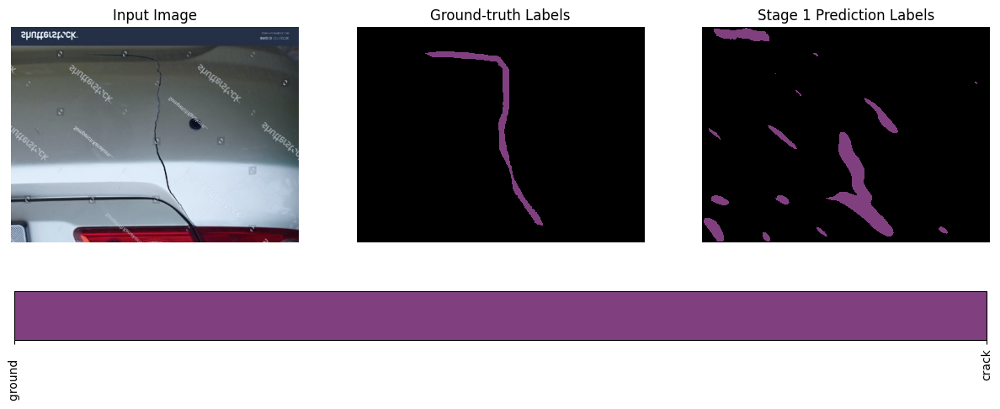

-----> saved best IOU at:  tensor(0.5394, device='cuda:0')
-----> saved best Loss at:  0.31263950280845165
best val iou tensor(0.5394, device='cuda:0')


Train Epoch: [1/50] Loss: 0.1688 mPA: 0.97%  Lr: 0.0009809803    IOU1: 0.5891 : 100%|██| 32/32 [00:20<00:00,  1.58it/s]
Eval Epoch: [1/50] Loss: 0.1229 mPA: 0.97%      IOU1: 0.5240 : 100%|█████████████████████| 8/8 [00:13<00:00,  1.70s/it]


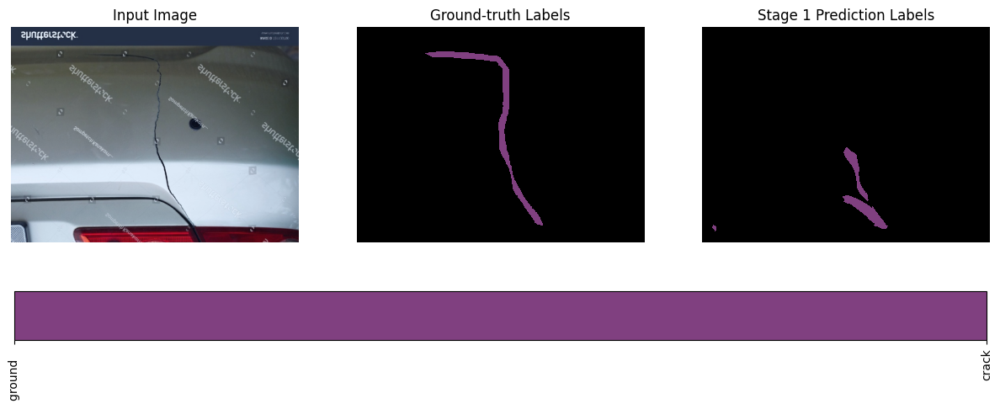

best val iou tensor(0.5394, device='cuda:0')


Train Epoch: [2/50] Loss: 0.1311 mPA: 0.97%  Lr: 0.0009716066    IOU1: 0.5770 : 100%|██| 32/32 [00:20<00:00,  1.58it/s]
Eval Epoch: [2/50] Loss: 0.1021 mPA: 0.98%      IOU1: 0.5598 : 100%|█████████████████████| 8/8 [00:13<00:00,  1.70s/it]


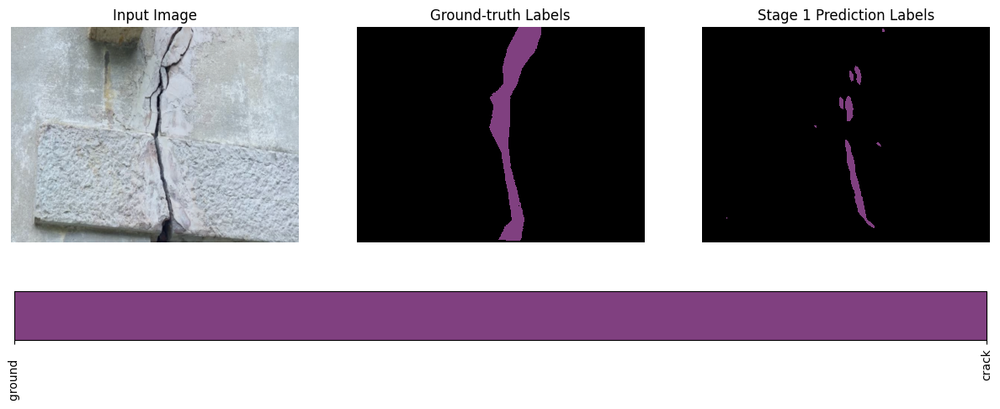

-----> saved best IOU at:  tensor(0.5598, device='cuda:0')
best val iou tensor(0.5598, device='cuda:0')


Train Epoch: [3/50] Loss: 0.1189 mPA: 0.97%  Lr: 0.0009623224    IOU1: 0.5888 : 100%|██| 32/32 [00:20<00:00,  1.57it/s]
Eval Epoch: [3/50] Loss: 0.1926 mPA: 0.94%      IOU1: 0.5663 : 100%|█████████████████████| 8/8 [00:13<00:00,  1.74s/it]


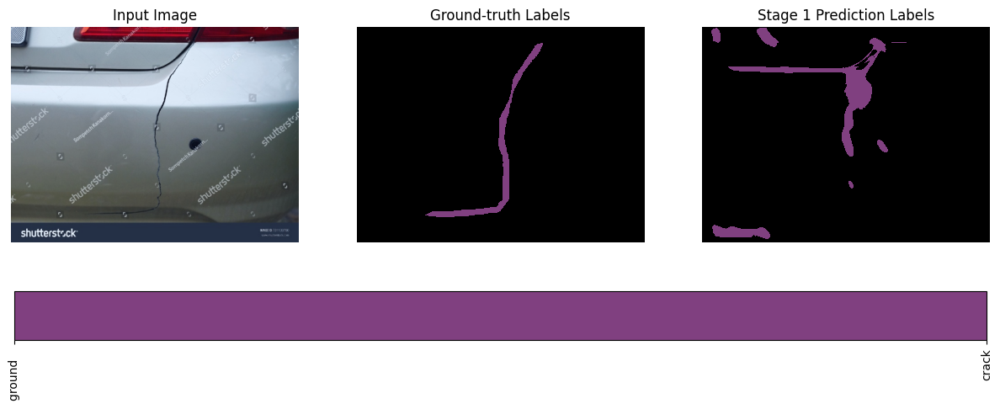

-----> saved best IOU at:  tensor(0.5663, device='cuda:0')
best val iou tensor(0.5663, device='cuda:0')


Train Epoch: [4/50] Loss: 0.1120 mPA: 0.97%  Lr: 0.0009531269    IOU1: 0.5842 : 100%|██| 32/32 [00:20<00:00,  1.57it/s]
Eval Epoch: [4/50] Loss: 0.0908 mPA: 0.98%      IOU1: 0.5836 : 100%|█████████████████████| 8/8 [00:13<00:00,  1.70s/it]


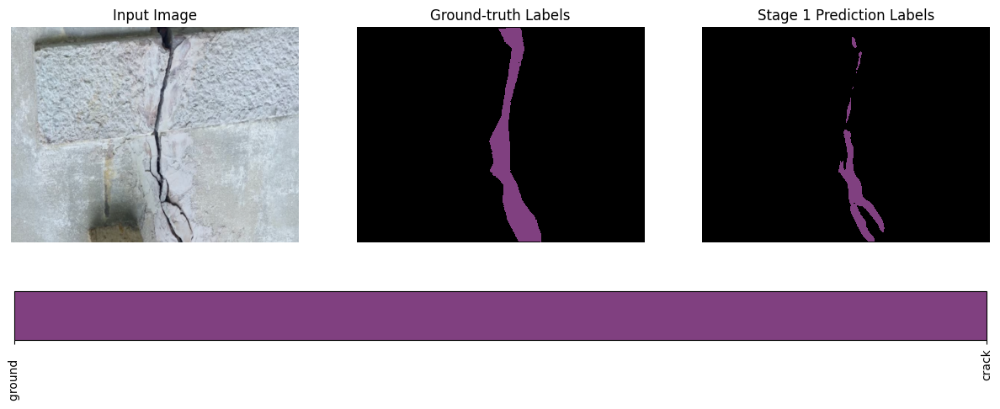

-----> saved best IOU at:  tensor(0.5836, device='cuda:0')
best val iou tensor(0.5836, device='cuda:0')


Train Epoch: [5/50] Loss: 0.1111 mPA: 0.96%  Lr: 0.0009440193    IOU1: 0.5828 : 100%|██| 32/32 [00:20<00:00,  1.55it/s]
Eval Epoch: [5/50] Loss: 0.0917 mPA: 0.97%      IOU1: 0.4902 : 100%|█████████████████████| 8/8 [00:13<00:00,  1.66s/it]


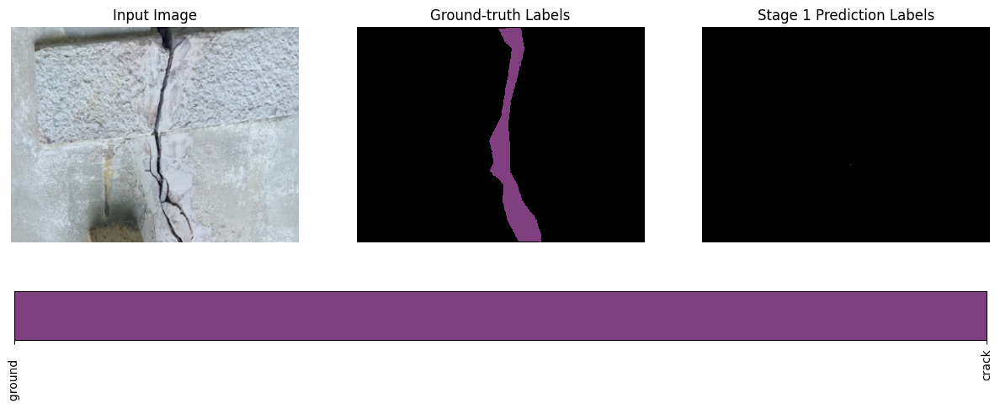

best val iou tensor(0.5836, device='cuda:0')


Train Epoch: [6/50] Loss: 0.1013 mPA: 0.97%  Lr: 0.0009349988    IOU1: 0.6158 : 100%|██| 32/32 [00:20<00:00,  1.56it/s]
Eval Epoch: [6/50] Loss: 0.0874 mPA: 0.97%      IOU1: 0.5408 : 100%|█████████████████████| 8/8 [00:13<00:00,  1.75s/it]


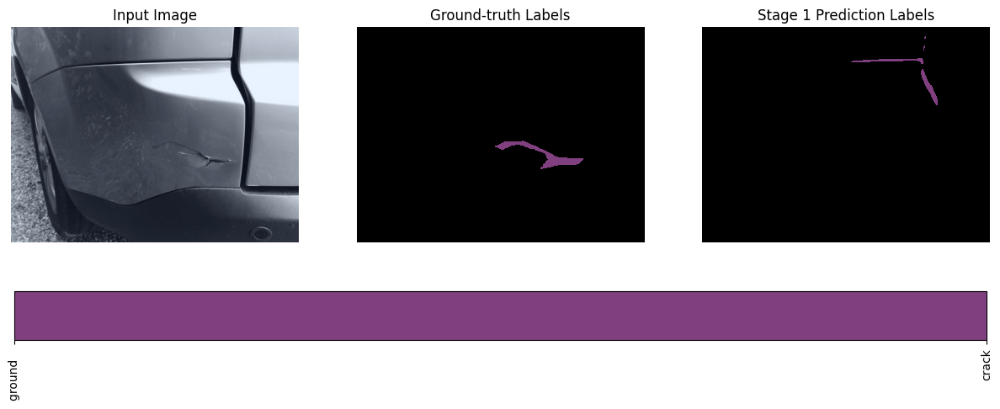

best val iou tensor(0.5836, device='cuda:0')


Train Epoch: [7/50] Loss: 0.0946 mPA: 0.97%  Lr: 0.0009260644    IOU1: 0.6658 : 100%|██| 32/32 [00:20<00:00,  1.57it/s]
Eval Epoch: [7/50] Loss: 0.1139 mPA: 0.96%      IOU1: 0.6204 : 100%|█████████████████████| 8/8 [00:14<00:00,  1.84s/it]


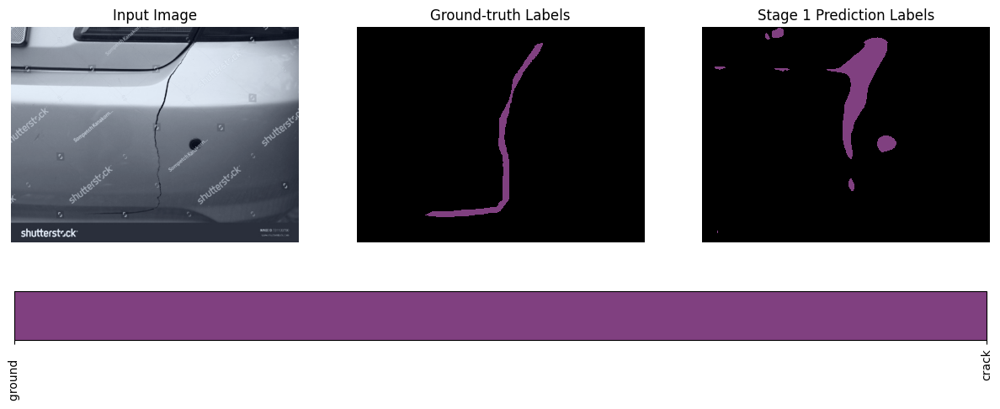

-----> saved best IOU at:  tensor(0.6204, device='cuda:0')
best val iou tensor(0.6204, device='cuda:0')


Train Epoch: [8/50] Loss: 0.0851 mPA: 0.97%  Lr: 0.0009172154    IOU1: 0.6844 : 100%|██| 32/32 [00:20<00:00,  1.58it/s]
Eval Epoch: [8/50] Loss: 0.0905 mPA: 0.98%      IOU1: 0.5295 : 100%|█████████████████████| 8/8 [00:13<00:00,  1.73s/it]


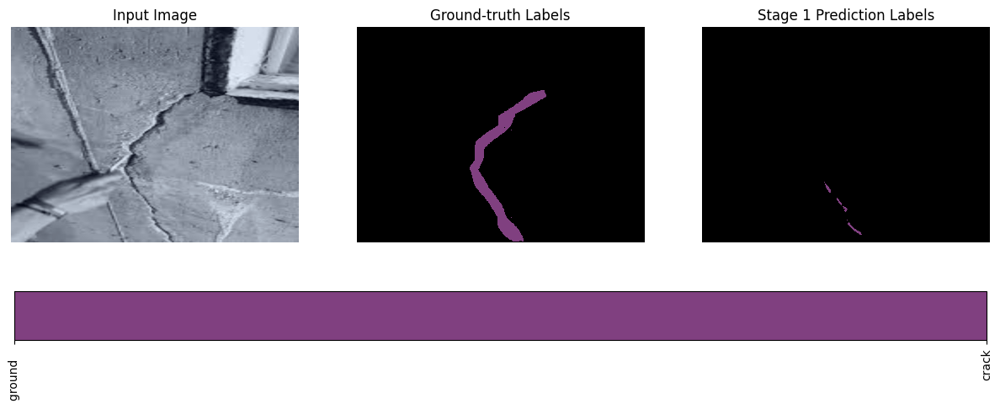

best val iou tensor(0.6204, device='cuda:0')


Train Epoch: [9/50] Loss: 0.0895 mPA: 0.97%  Lr: 0.0009084509    IOU1: 0.6643 : 100%|██| 32/32 [00:20<00:00,  1.57it/s]
Eval Epoch: [9/50] Loss: 0.0994 mPA: 0.96%      IOU1: 0.6115 : 100%|█████████████████████| 8/8 [00:13<00:00,  1.70s/it]


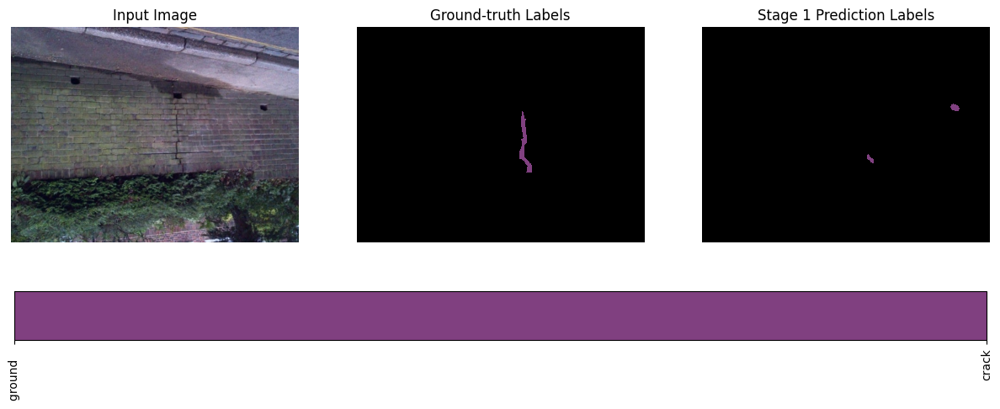

best val iou tensor(0.6204, device='cuda:0')


Train Epoch: [10/50] Loss: 0.0813 mPA: 0.97%  Lr: 0.0008997702    IOU1: 0.6893 : 100%|█| 32/32 [00:20<00:00,  1.57it/s]
Eval Epoch: [10/50] Loss: 0.0869 mPA: 0.97%      IOU1: 0.6365 : 100%|████████████████████| 8/8 [00:14<00:00,  1.77s/it]


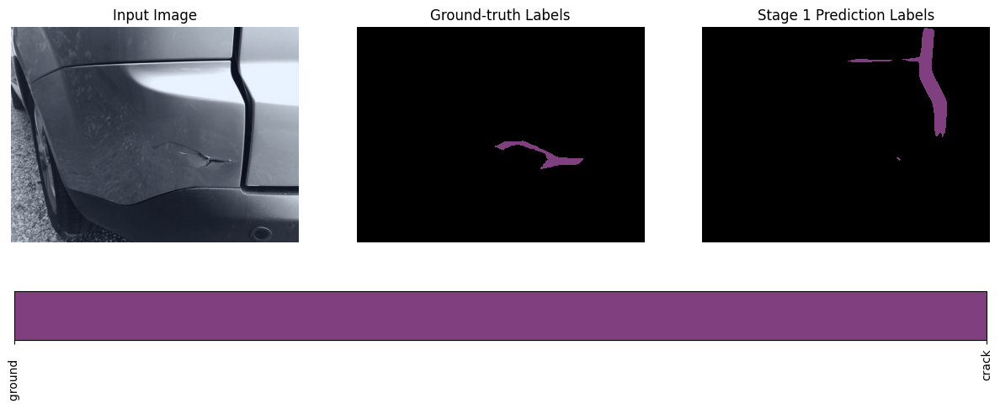

-----> saved best IOU at:  tensor(0.6365, device='cuda:0')
best val iou tensor(0.6365, device='cuda:0')


Train Epoch: [11/50] Loss: 0.0767 mPA: 0.97%  Lr: 0.0008911725    IOU1: 0.6914 : 100%|█| 32/32 [00:20<00:00,  1.57it/s]
Eval Epoch: [11/50] Loss: 0.0738 mPA: 0.98%      IOU1: 0.6491 : 100%|████████████████████| 8/8 [00:14<00:00,  1.79s/it]


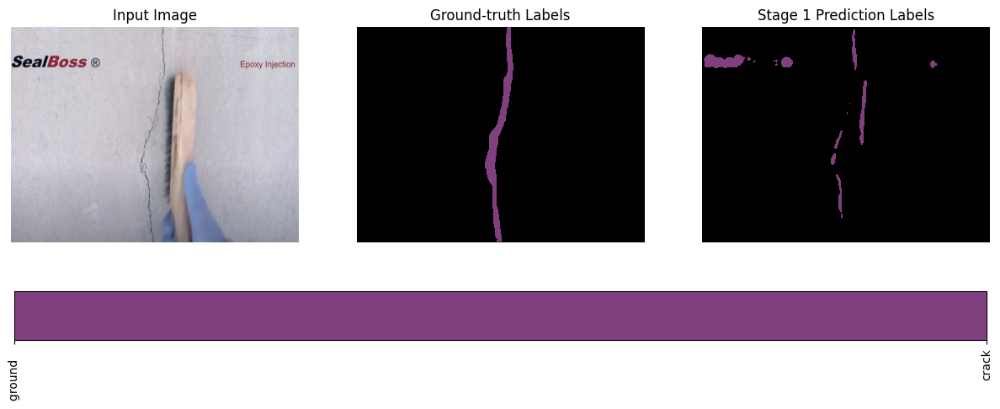

-----> saved best IOU at:  tensor(0.6491, device='cuda:0')
best val iou tensor(0.6491, device='cuda:0')


Train Epoch: [12/50] Loss: 0.0780 mPA: 0.97%  Lr: 0.0008826569    IOU1: 0.6906 : 100%|█| 32/32 [00:20<00:00,  1.58it/s]
Eval Epoch: [12/50] Loss: 0.1026 mPA: 0.97%      IOU1: 0.6211 : 100%|████████████████████| 8/8 [00:13<00:00,  1.71s/it]


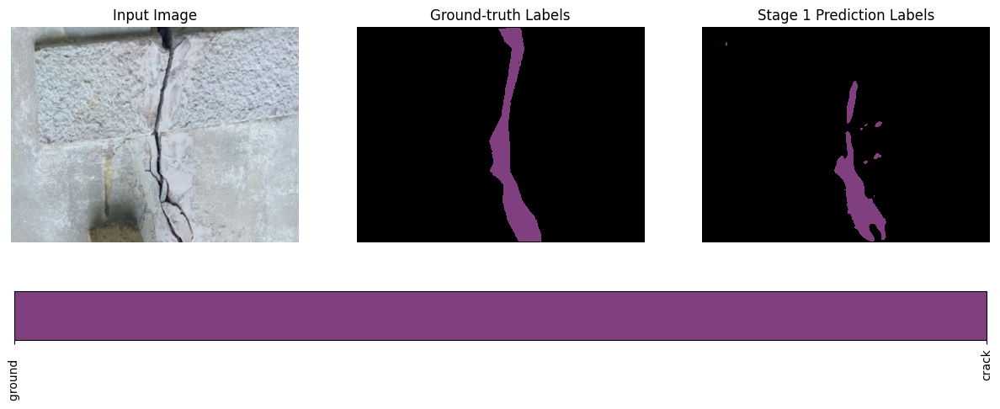

best val iou tensor(0.6491, device='cuda:0')


Train Epoch: [13/50] Loss: 0.0775 mPA: 0.97%  Lr: 0.0008742227    IOU1: 0.6858 : 100%|█| 32/32 [00:20<00:00,  1.55it/s]
Eval Epoch: [13/50] Loss: 0.0767 mPA: 0.98%      IOU1: 0.6169 : 100%|████████████████████| 8/8 [00:13<00:00,  1.75s/it]


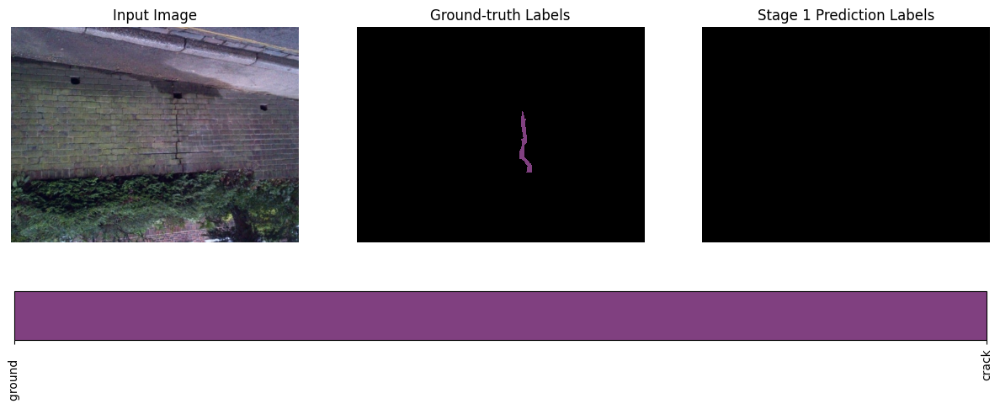

best val iou tensor(0.6491, device='cuda:0')


Train Epoch: [14/50] Loss: 0.0755 mPA: 0.97%  Lr: 0.0008658690    IOU1: 0.6890 : 100%|█| 32/32 [00:20<00:00,  1.53it/s]
Eval Epoch: [14/50] Loss: 0.0785 mPA: 0.98%      IOU1: 0.6350 : 100%|████████████████████| 8/8 [00:15<00:00,  1.97s/it]


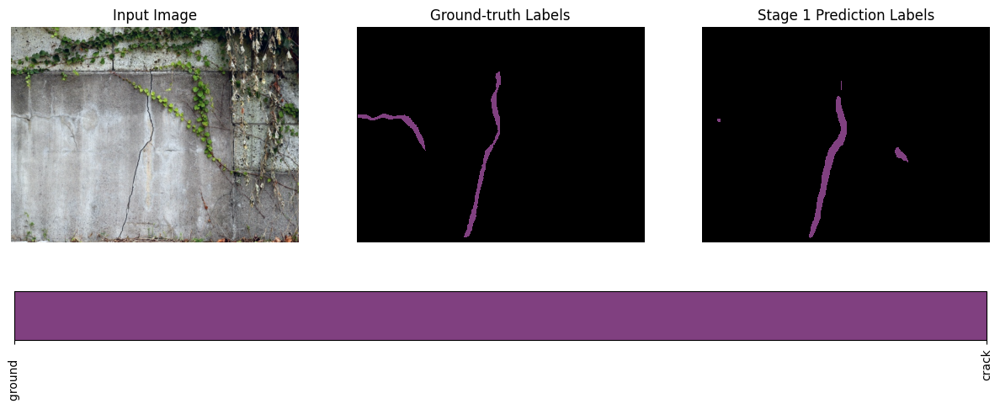

best val iou tensor(0.6491, device='cuda:0')


Train Epoch: [15/50] Loss: 0.0782 mPA: 0.97%  Lr: 0.0008575952    IOU1: 0.6946 : 100%|█| 32/32 [00:20<00:00,  1.53it/s]
Eval Epoch: [15/50] Loss: 0.1164 mPA: 0.97%      IOU1: 0.5076 : 100%|████████████████████| 8/8 [00:15<00:00,  1.92s/it]


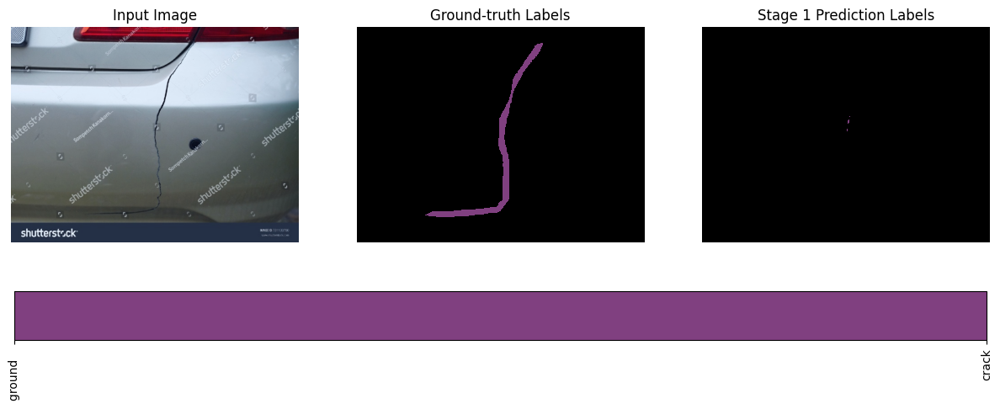

best val iou tensor(0.6491, device='cuda:0')


Train Epoch: [16/50] Loss: 0.0743 mPA: 0.97%  Lr: 0.0008494005    IOU1: 0.6887 : 100%|█| 32/32 [00:20<00:00,  1.58it/s]
Eval Epoch: [16/50] Loss: 0.0752 mPA: 0.97%      IOU1: 0.6551 : 100%|████████████████████| 8/8 [00:13<00:00,  1.67s/it]


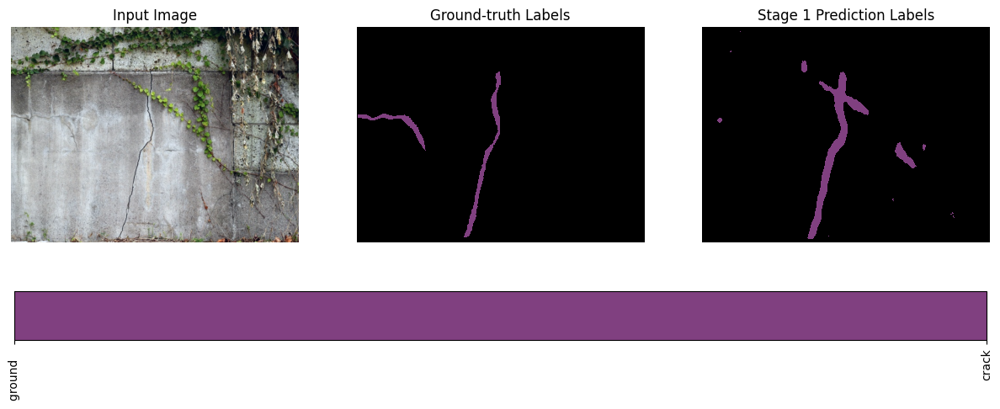

-----> saved best IOU at:  tensor(0.6551, device='cuda:0')
best val iou tensor(0.6551, device='cuda:0')


Train Epoch: [17/50] Loss: 0.0736 mPA: 0.97%  Lr: 0.0008412840    IOU1: 0.7018 : 100%|█| 32/32 [00:19<00:00,  1.60it/s]
Eval Epoch: [17/50] Loss: 0.0714 mPA: 0.98%      IOU1: 0.6337 : 100%|████████████████████| 8/8 [00:13<00:00,  1.67s/it]


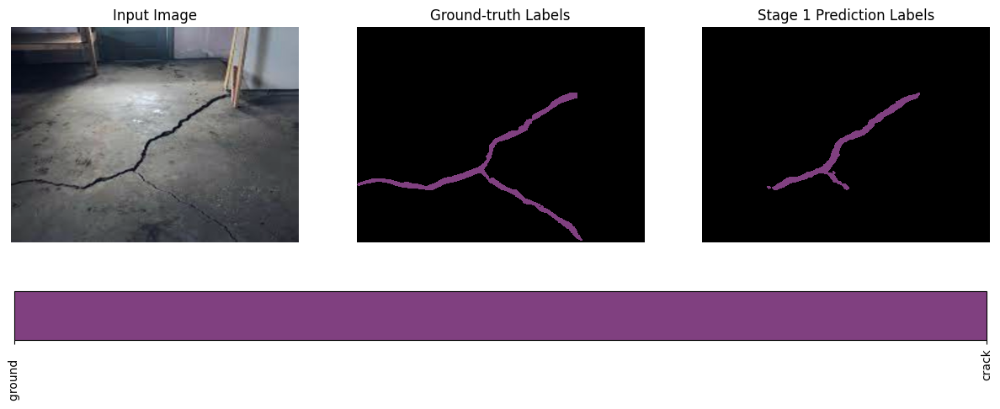

best val iou tensor(0.6551, device='cuda:0')


Train Epoch: [18/50] Loss: 0.0695 mPA: 0.97%  Lr: 0.0008332452    IOU1: 0.7079 : 100%|█| 32/32 [00:19<00:00,  1.60it/s]
Eval Epoch: [18/50] Loss: 0.0746 mPA: 0.98%      IOU1: 0.6599 : 100%|████████████████████| 8/8 [00:14<00:00,  1.77s/it]


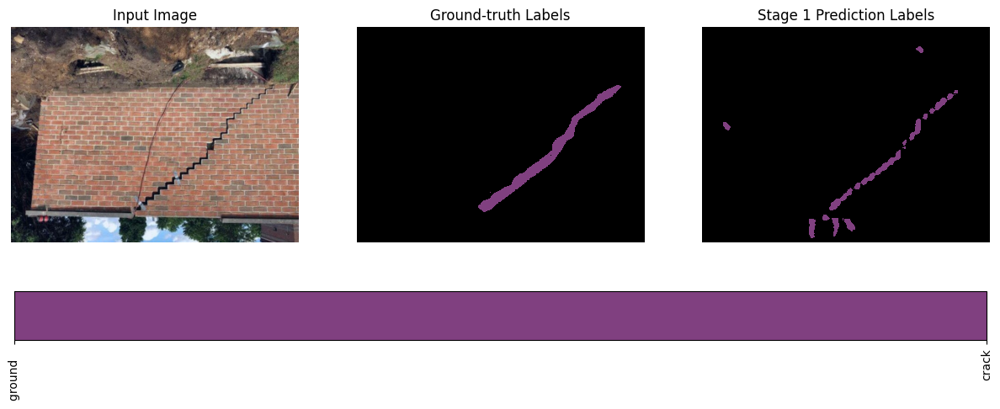

-----> saved best IOU at:  tensor(0.6599, device='cuda:0')
best val iou tensor(0.6599, device='cuda:0')


Train Epoch: [19/50] Loss: 0.0665 mPA: 0.98%  Lr: 0.0008252831    IOU1: 0.7158 : 100%|█| 32/32 [00:20<00:00,  1.57it/s]
Eval Epoch: [19/50] Loss: 0.0722 mPA: 0.98%      IOU1: 0.6443 : 100%|████████████████████| 8/8 [00:14<00:00,  1.79s/it]


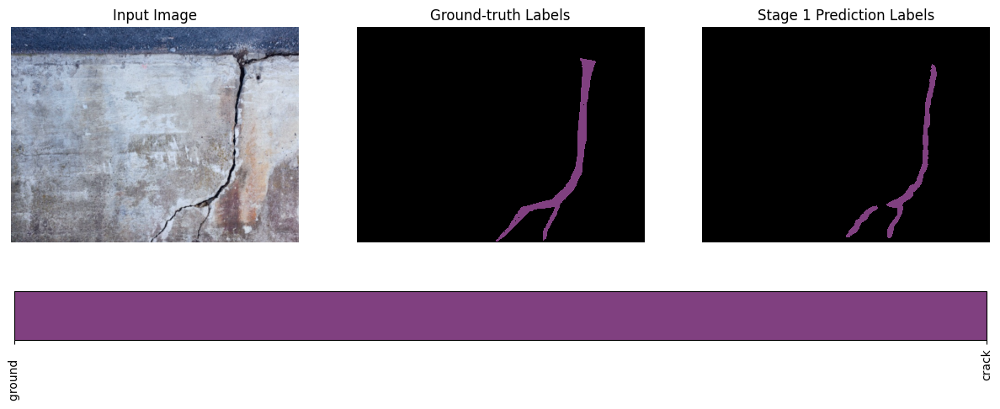

best val iou tensor(0.6599, device='cuda:0')


Train Epoch: [20/50] Loss: 0.0656 mPA: 0.98%  Lr: 0.0008173971    IOU1: 0.7270 : 100%|█| 32/32 [00:20<00:00,  1.55it/s]
Eval Epoch: [20/50] Loss: 0.0721 mPA: 0.97%      IOU1: 0.6277 : 100%|████████████████████| 8/8 [00:14<00:00,  1.85s/it]


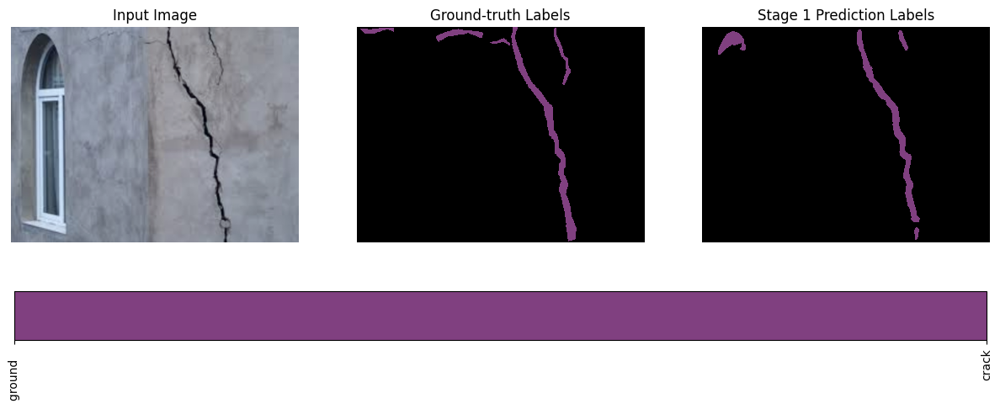

best val iou tensor(0.6599, device='cuda:0')


Train Epoch: [21/50] Loss: 0.0579 mPA: 0.98%  Lr: 0.0008095865    IOU1: 0.7399 : 100%|█| 32/32 [00:20<00:00,  1.54it/s]
Eval Epoch: [21/50] Loss: 0.0774 mPA: 0.98%      IOU1: 0.6363 : 100%|████████████████████| 8/8 [00:14<00:00,  1.75s/it]


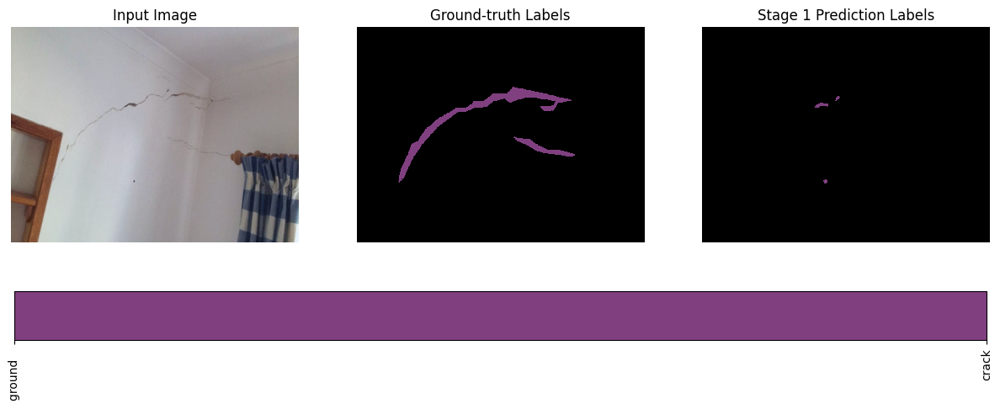

best val iou tensor(0.6599, device='cuda:0')


Train Epoch: [22/50] Loss: 0.0614 mPA: 0.98%  Lr: 0.0008018505    IOU1: 0.7362 : 100%|█| 32/32 [00:20<00:00,  1.54it/s]
Eval Epoch: [22/50] Loss: 0.0731 mPA: 0.98%      IOU1: 0.6003 : 100%|████████████████████| 8/8 [00:15<00:00,  1.90s/it]


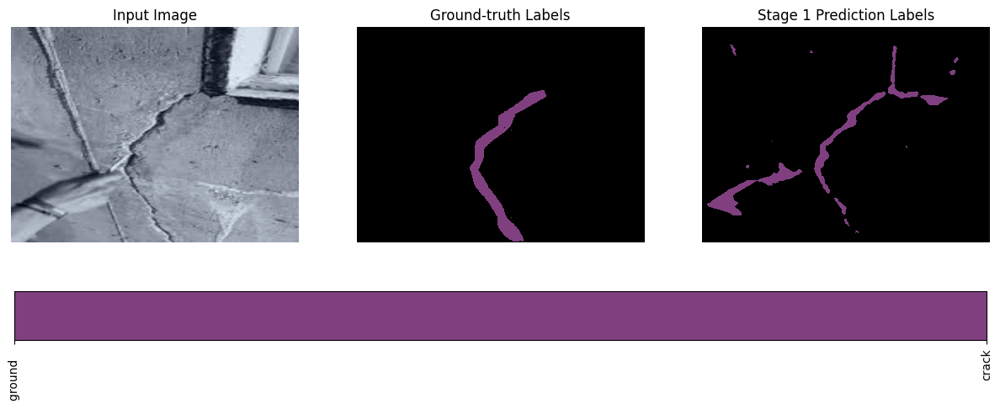

best val iou tensor(0.6599, device='cuda:0')


Train Epoch: [23/50] Loss: 0.0553 mPA: 0.98%  Lr: 0.0007941884    IOU1: 0.7547 : 100%|█| 32/32 [00:20<00:00,  1.54it/s]
Eval Epoch: [23/50] Loss: 0.0651 mPA: 0.98%      IOU1: 0.6566 : 100%|████████████████████| 8/8 [00:14<00:00,  1.77s/it]


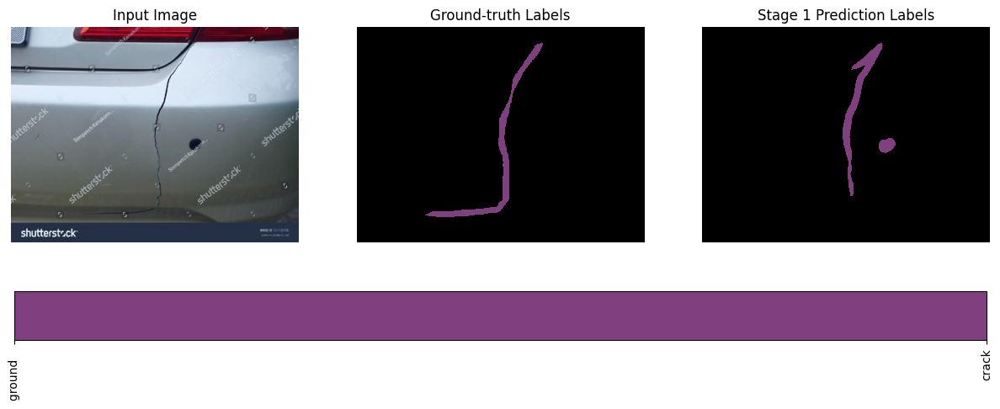

best val iou tensor(0.6599, device='cuda:0')


Train Epoch: [24/50] Loss: 0.0606 mPA: 0.98%  Lr: 0.0007865995    IOU1: 0.7441 : 100%|█| 32/32 [00:20<00:00,  1.58it/s]
Eval Epoch: [24/50] Loss: 0.0793 mPA: 0.97%      IOU1: 0.6080 : 100%|████████████████████| 8/8 [00:13<00:00,  1.67s/it]


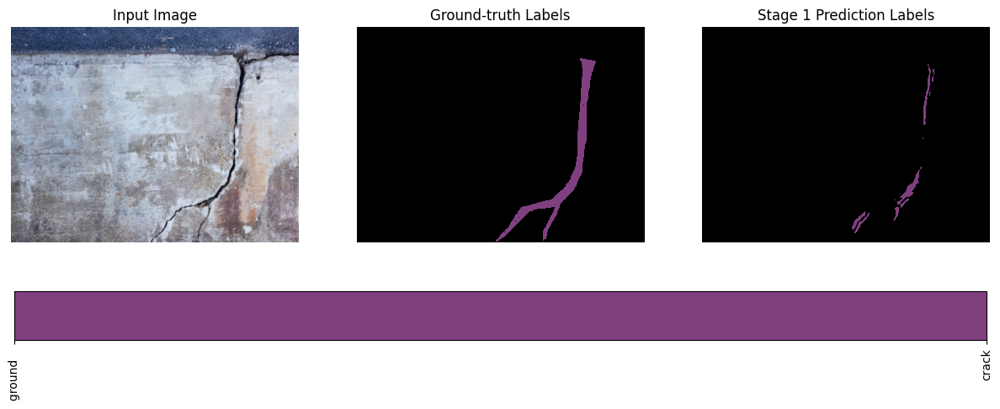

best val iou tensor(0.6599, device='cuda:0')


Train Epoch: [25/50] Loss: 0.0581 mPA: 0.98%  Lr: 0.0007790832    IOU1: 0.7444 : 100%|█| 32/32 [00:20<00:00,  1.54it/s]
Eval Epoch: [25/50] Loss: 0.0775 mPA: 0.98%      IOU1: 0.6678 : 100%|████████████████████| 8/8 [00:14<00:00,  1.82s/it]


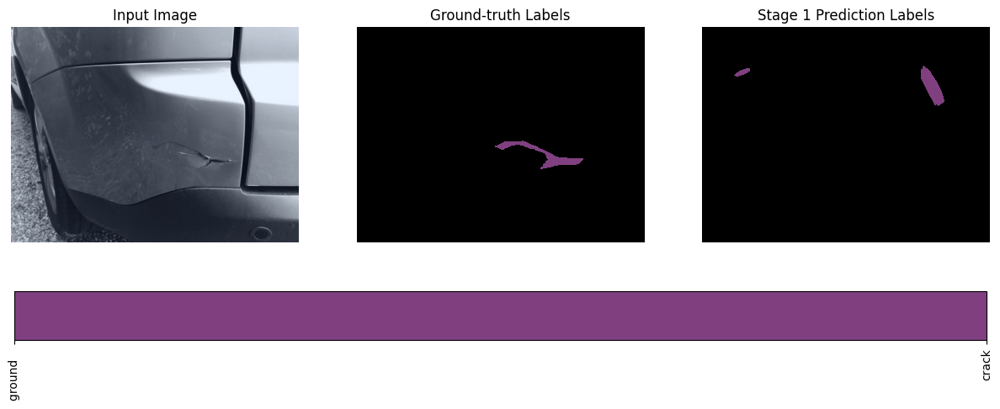

-----> saved best IOU at:  tensor(0.6678, device='cuda:0')
best val iou tensor(0.6678, device='cuda:0')


Train Epoch: [26/50] Loss: 0.0528 mPA: 0.98%  Lr: 0.0007716387    IOU1: 0.7658 : 100%|█| 32/32 [00:20<00:00,  1.53it/s]
Eval Epoch: [26/50] Loss: 0.0657 mPA: 0.98%      IOU1: 0.6688 : 100%|████████████████████| 8/8 [00:13<00:00,  1.71s/it]


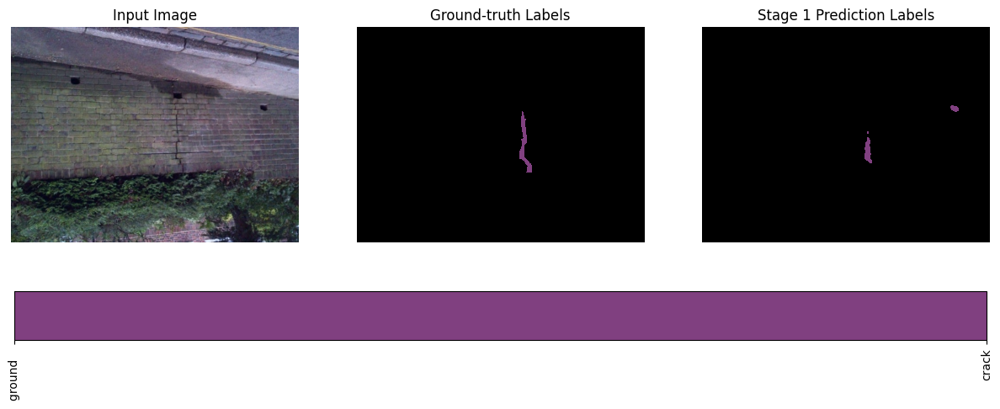

-----> saved best IOU at:  tensor(0.6688, device='cuda:0')
best val iou tensor(0.6688, device='cuda:0')


Train Epoch: [27/50] Loss: 0.0528 mPA: 0.98%  Lr: 0.0007642653    IOU1: 0.7646 : 100%|█| 32/32 [00:20<00:00,  1.56it/s]
Eval Epoch: [27/50] Loss: 0.0796 mPA: 0.98%      IOU1: 0.6222 : 100%|████████████████████| 8/8 [00:14<00:00,  1.79s/it]


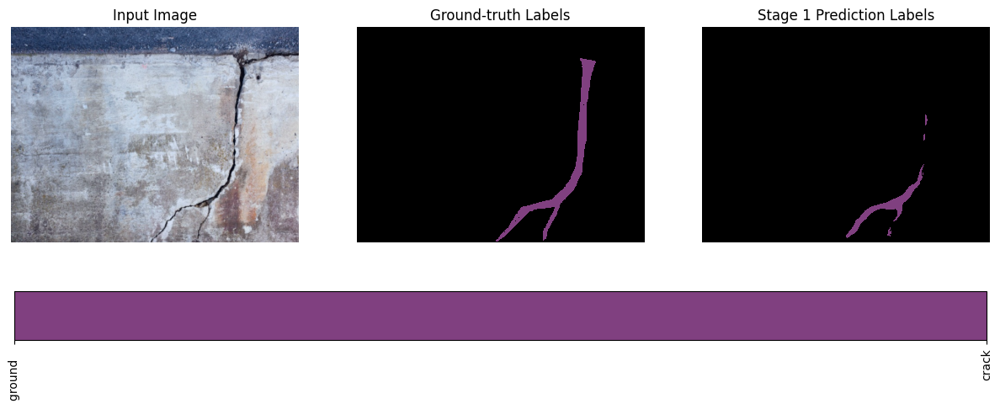

best val iou tensor(0.6688, device='cuda:0')


Train Epoch: [28/50] Loss: 0.0576 mPA: 0.98%  Lr: 0.0007569623    IOU1: 0.7526 : 100%|█| 32/32 [00:20<00:00,  1.59it/s]
Eval Epoch: [28/50] Loss: 0.0798 mPA: 0.97%      IOU1: 0.6665 : 100%|████████████████████| 8/8 [00:14<00:00,  1.75s/it]


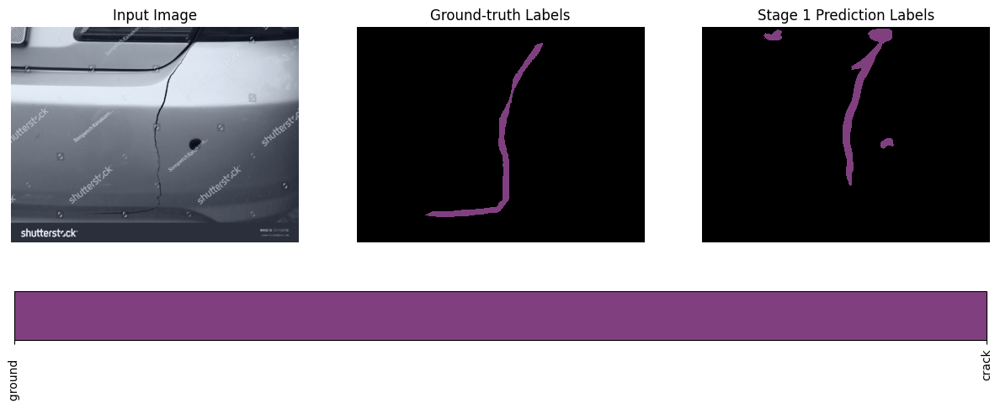

best val iou tensor(0.6688, device='cuda:0')


Train Epoch: [29/50] Loss: 0.0520 mPA: 0.98%  Lr: 0.0007497292    IOU1: 0.7695 : 100%|█| 32/32 [00:20<00:00,  1.59it/s]
Eval Epoch: [29/50] Loss: 0.0672 mPA: 0.98%      IOU1: 0.6714 : 100%|████████████████████| 8/8 [00:13<00:00,  1.69s/it]


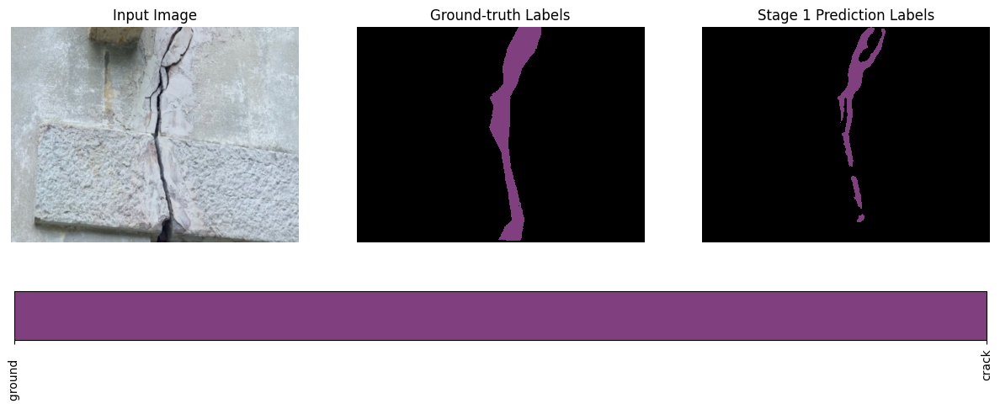

-----> saved best IOU at:  tensor(0.6714, device='cuda:0')
best val iou tensor(0.6714, device='cuda:0')


Train Epoch: [30/50] Loss: 0.0531 mPA: 0.98%  Lr: 0.0007425652    IOU1: 0.7724 : 100%|█| 32/32 [00:20<00:00,  1.53it/s]
Eval Epoch: [30/50] Loss: 0.0707 mPA: 0.97%      IOU1: 0.6545 : 100%|████████████████████| 8/8 [00:13<00:00,  1.72s/it]


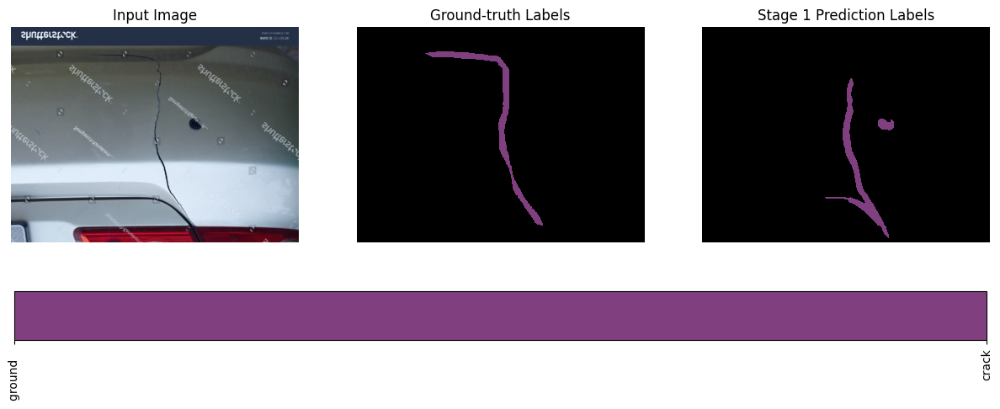

best val iou tensor(0.6714, device='cuda:0')


Train Epoch: [31/50] Loss: 0.0480 mPA: 0.98%  Lr: 0.0007354696    IOU1: 0.7788 : 100%|█| 32/32 [00:20<00:00,  1.57it/s]
Eval Epoch: [31/50] Loss: 0.0710 mPA: 0.98%      IOU1: 0.6496 : 100%|████████████████████| 8/8 [00:14<00:00,  1.82s/it]


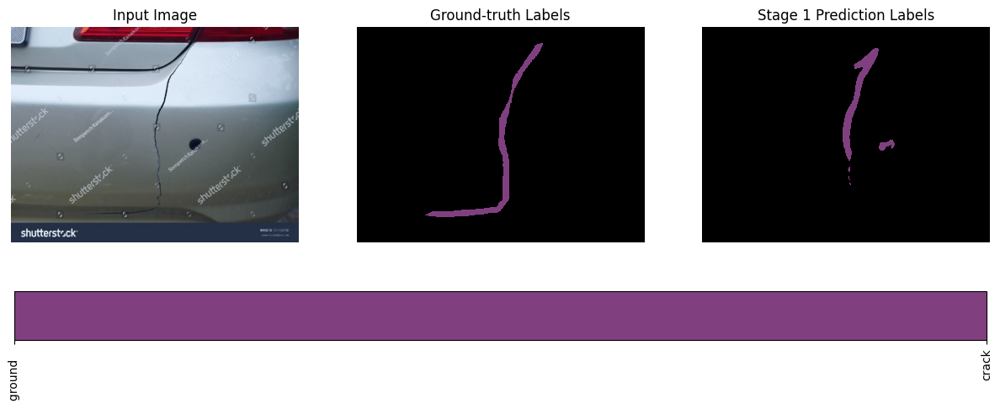

best val iou tensor(0.6714, device='cuda:0')


Train Epoch: [32/50] Loss: 0.0433 mPA: 0.98%  Lr: 0.0007284418    IOU1: 0.7975 : 100%|█| 32/32 [00:20<00:00,  1.58it/s]
Eval Epoch: [32/50] Loss: 0.0611 mPA: 0.98%      IOU1: 0.7004 : 100%|████████████████████| 8/8 [00:13<00:00,  1.75s/it]


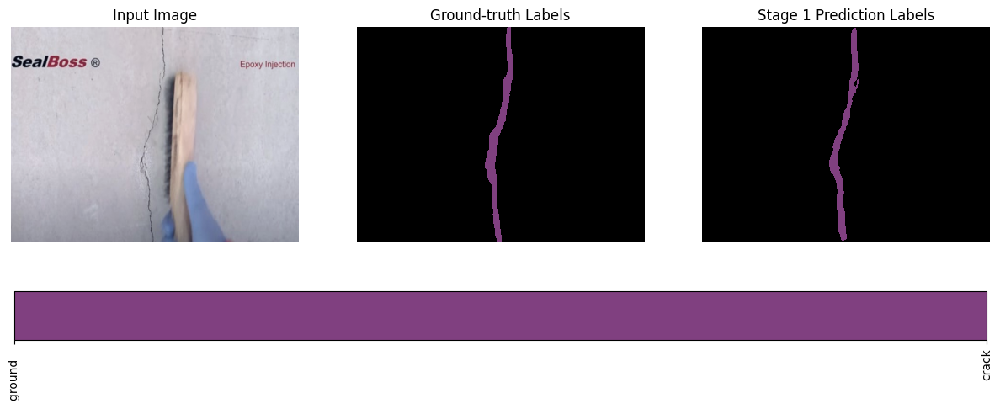

-----> saved best IOU at:  tensor(0.7004, device='cuda:0')
best val iou tensor(0.7004, device='cuda:0')


Train Epoch: [33/50] Loss: 0.0449 mPA: 0.98%  Lr: 0.0007214812    IOU1: 0.7892 : 100%|█| 32/32 [00:20<00:00,  1.59it/s]
Eval Epoch: [33/50] Loss: 0.0726 mPA: 0.98%      IOU1: 0.6907 : 100%|████████████████████| 8/8 [00:13<00:00,  1.68s/it]


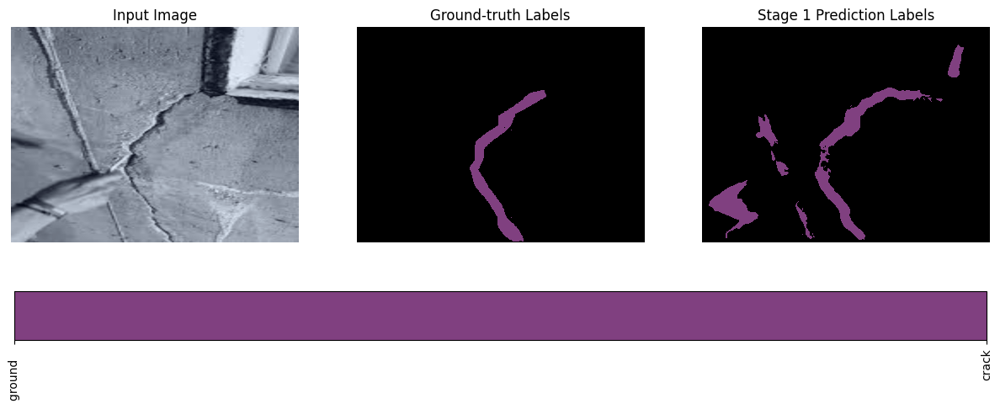

best val iou tensor(0.7004, device='cuda:0')


Train Epoch: [34/50] Loss: 0.0455 mPA: 0.98%  Lr: 0.0007145871    IOU1: 0.7881 : 100%|█| 32/32 [00:20<00:00,  1.58it/s]
Eval Epoch: [34/50] Loss: 0.0603 mPA: 0.98%      IOU1: 0.6775 : 100%|████████████████████| 8/8 [00:14<00:00,  1.78s/it]


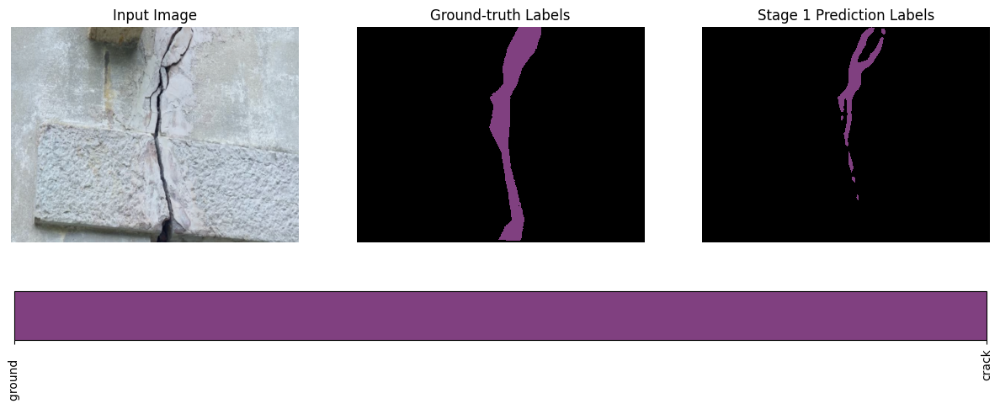

best val iou tensor(0.7004, device='cuda:0')


Train Epoch: [35/50] Loss: 0.0438 mPA: 0.98%  Lr: 0.0007077589    IOU1: 0.7917 : 100%|█| 32/32 [00:20<00:00,  1.55it/s]
Eval Epoch: [35/50] Loss: 0.0610 mPA: 0.98%      IOU1: 0.6822 : 100%|████████████████████| 8/8 [00:14<00:00,  1.75s/it]


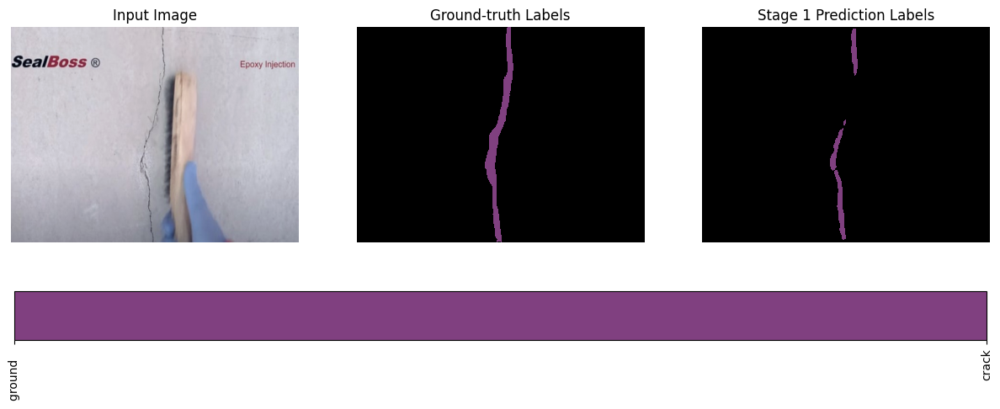

best val iou tensor(0.7004, device='cuda:0')


Train Epoch: [36/50] Loss: 0.0409 mPA: 0.98%  Lr: 0.0007009959    IOU1: 0.8023 : 100%|█| 32/32 [00:20<00:00,  1.56it/s]
Eval Epoch: [36/50] Loss: 0.0780 mPA: 0.98%      IOU1: 0.6693 : 100%|████████████████████| 8/8 [00:13<00:00,  1.65s/it]


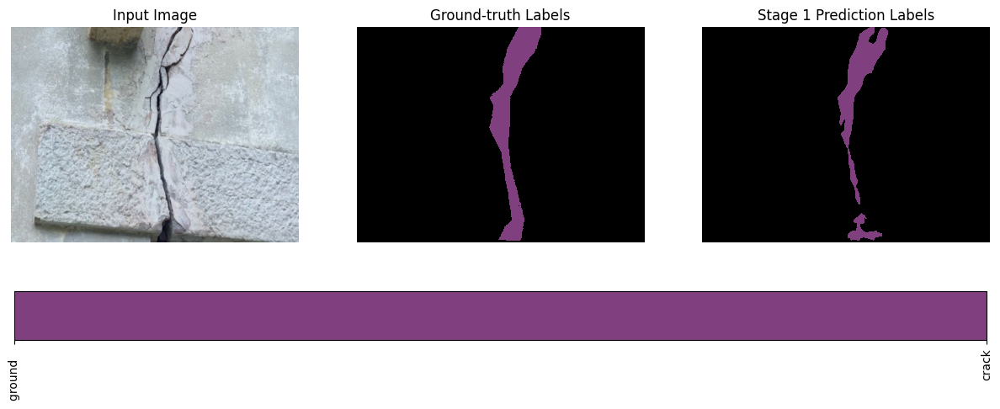

best val iou tensor(0.7004, device='cuda:0')


Train Epoch: [37/50] Loss: 0.0378 mPA: 0.99%  Lr: 0.0006942975    IOU1: 0.8166 : 100%|█| 32/32 [00:20<00:00,  1.56it/s]
Eval Epoch: [37/50] Loss: 0.0583 mPA: 0.98%      IOU1: 0.6687 : 100%|████████████████████| 8/8 [00:14<00:00,  1.78s/it]


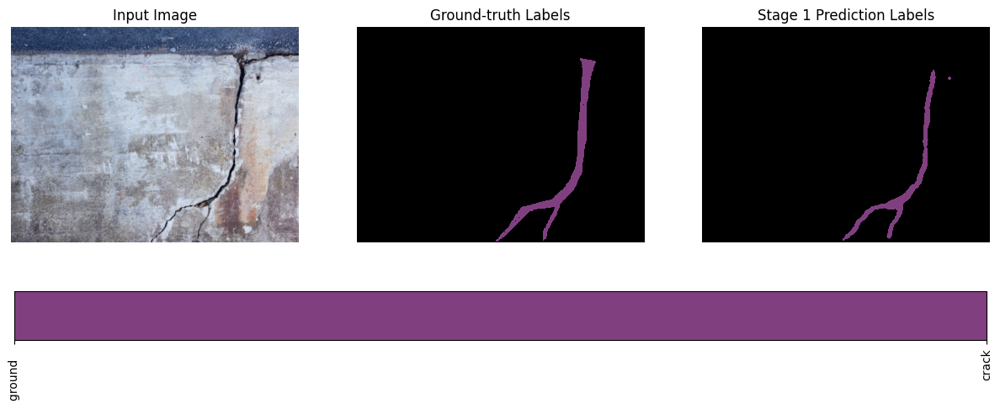

best val iou tensor(0.7004, device='cuda:0')


Train Epoch: [38/50] Loss: 0.0429 mPA: 0.98%  Lr: 0.0006876631    IOU1: 0.7948 : 100%|█| 32/32 [00:20<00:00,  1.56it/s]
Eval Epoch: [38/50] Loss: 0.0640 mPA: 0.98%      IOU1: 0.6677 : 100%|████████████████████| 8/8 [00:14<00:00,  1.85s/it]


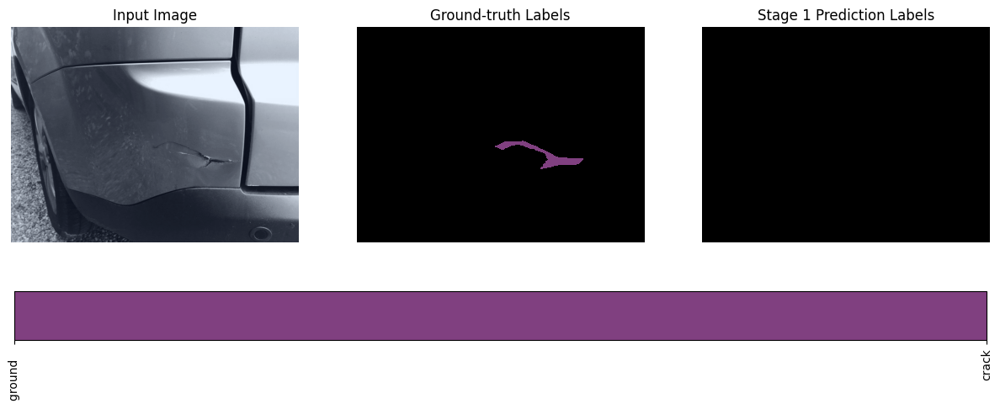

best val iou tensor(0.7004, device='cuda:0')


Train Epoch: [39/50] Loss: 0.0406 mPA: 0.98%  Lr: 0.0006810922    IOU1: 0.8055 : 100%|█| 32/32 [00:20<00:00,  1.53it/s]
Eval Epoch: [39/50] Loss: 0.0572 mPA: 0.98%      IOU1: 0.7093 : 100%|████████████████████| 8/8 [00:14<00:00,  1.76s/it]


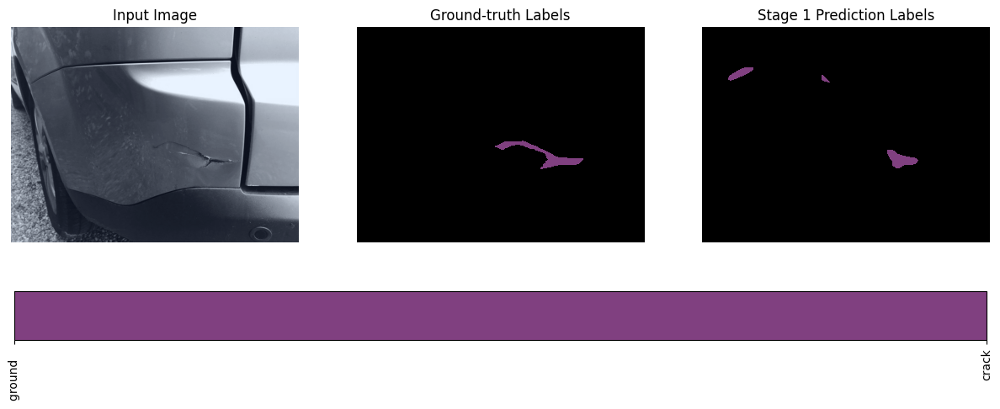

-----> saved best IOU at:  tensor(0.7093, device='cuda:0')
best val iou tensor(0.7093, device='cuda:0')


Train Epoch: [40/50] Loss: 0.0412 mPA: 0.98%  Lr: 0.0006745840    IOU1: 0.8016 : 100%|█| 32/32 [00:20<00:00,  1.58it/s]
Eval Epoch: [40/50] Loss: 0.0528 mPA: 0.98%      IOU1: 0.7083 : 100%|████████████████████| 8/8 [00:14<00:00,  1.77s/it]


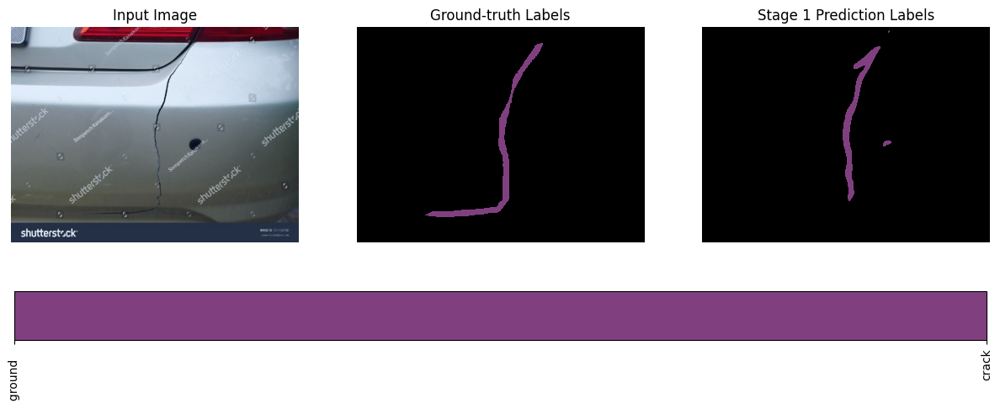

best val iou tensor(0.7093, device='cuda:0')


Train Epoch: [41/50] Loss: 0.0383 mPA: 0.99%  Lr: 0.0006681380    IOU1: 0.8134 : 100%|█| 32/32 [00:20<00:00,  1.55it/s]
Eval Epoch: [41/50] Loss: 0.0598 mPA: 0.98%      IOU1: 0.7085 : 100%|████████████████████| 8/8 [00:13<00:00,  1.70s/it]


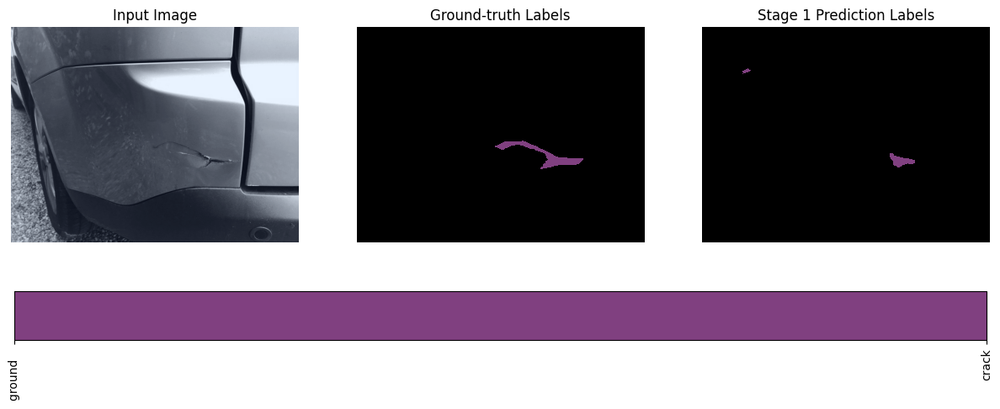

best val iou tensor(0.7093, device='cuda:0')


Train Epoch: [42/50] Loss: 0.0363 mPA: 0.99%  Lr: 0.0006617536    IOU1: 0.8216 : 100%|█| 32/32 [00:20<00:00,  1.55it/s]
Eval Epoch: [42/50] Loss: 0.0611 mPA: 0.98%      IOU1: 0.7217 : 100%|████████████████████| 8/8 [00:14<00:00,  1.78s/it]


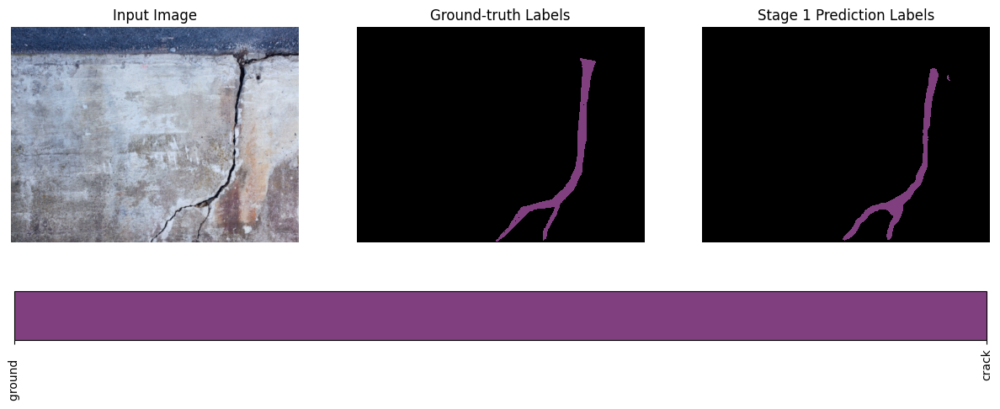

-----> saved best IOU at:  tensor(0.7217, device='cuda:0')
best val iou tensor(0.7217, device='cuda:0')


Train Epoch: [43/50] Loss: 0.0362 mPA: 0.99%  Lr: 0.0006554303    IOU1: 0.8188 : 100%|█| 32/32 [00:20<00:00,  1.55it/s]
Eval Epoch: [43/50] Loss: 0.0592 mPA: 0.98%      IOU1: 0.7191 : 100%|████████████████████| 8/8 [00:13<00:00,  1.75s/it]


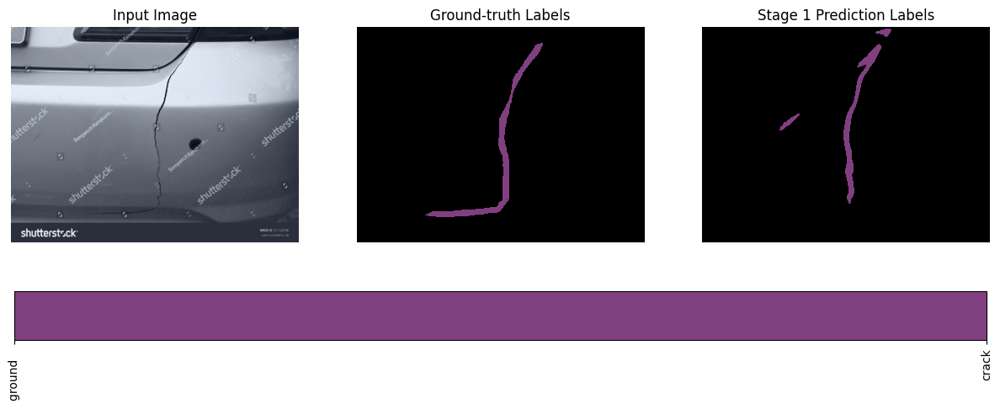

best val iou tensor(0.7217, device='cuda:0')


Train Epoch: [44/50] Loss: 0.0420 mPA: 0.98%  Lr: 0.0006491673    IOU1: 0.7962 : 100%|█| 32/32 [00:20<00:00,  1.54it/s]
Eval Epoch: [44/50] Loss: 0.0943 mPA: 0.97%      IOU1: 0.6782 : 100%|████████████████████| 8/8 [00:14<00:00,  1.83s/it]


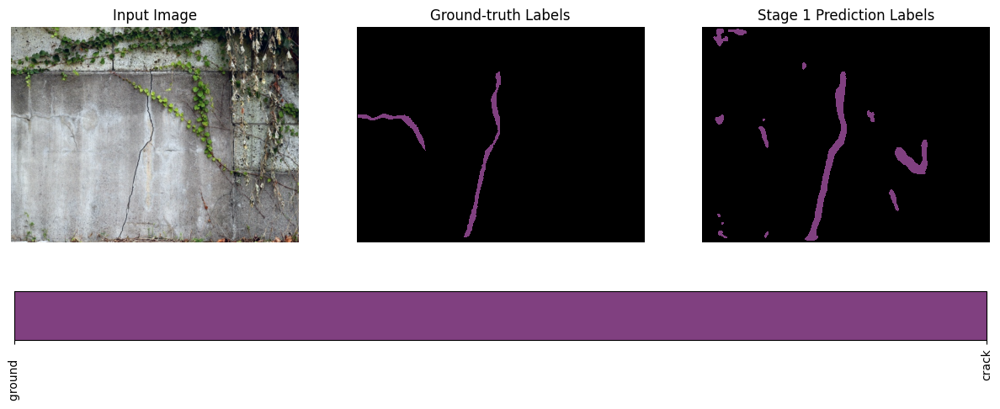

best val iou tensor(0.7217, device='cuda:0')


Train Epoch: [45/50] Loss: 0.0429 mPA: 0.98%  Lr: 0.0006429642    IOU1: 0.7948 : 100%|█| 32/32 [00:21<00:00,  1.51it/s]
Eval Epoch: [45/50] Loss: 0.0657 mPA: 0.98%      IOU1: 0.6572 : 100%|████████████████████| 8/8 [00:14<00:00,  1.79s/it]


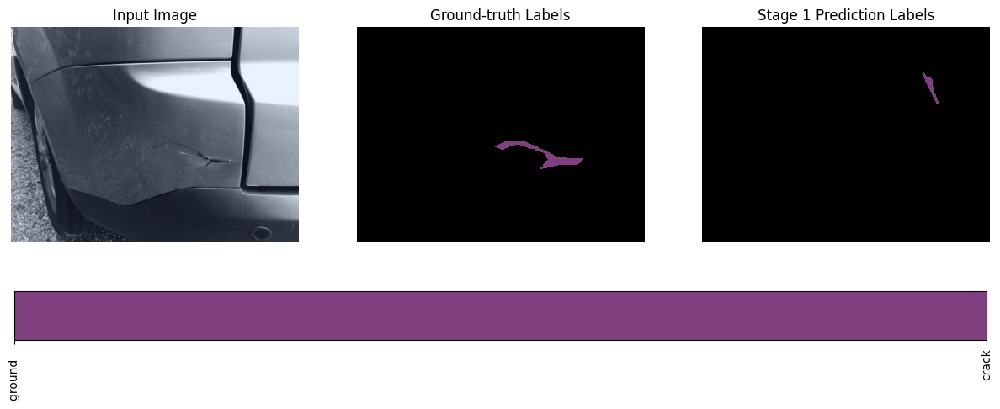

best val iou tensor(0.7217, device='cuda:0')


Train Epoch: [46/50] Loss: 0.0351 mPA: 0.99%  Lr: 0.0006368203    IOU1: 0.8298 : 100%|█| 32/32 [00:20<00:00,  1.54it/s]
Eval Epoch: [46/50] Loss: 0.0494 mPA: 0.98%      IOU1: 0.7211 : 100%|████████████████████| 8/8 [00:13<00:00,  1.71s/it]


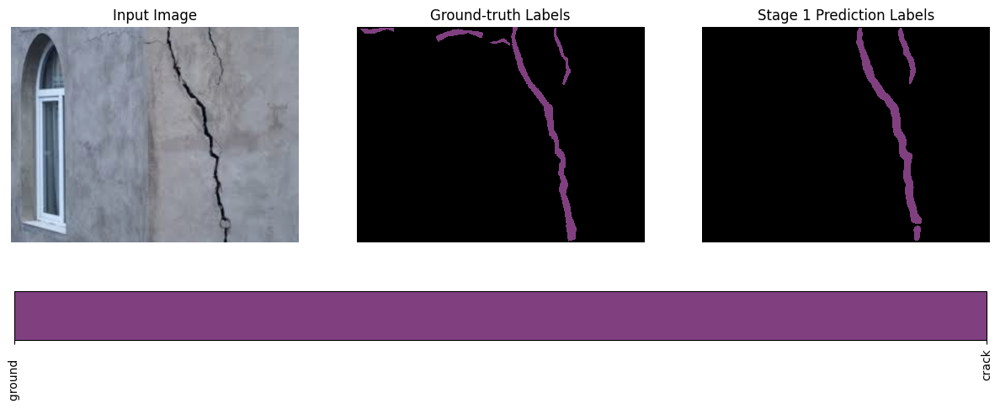

best val iou tensor(0.7217, device='cuda:0')


Train Epoch: [47/50] Loss: 0.0335 mPA: 0.99%  Lr: 0.0006307352    IOU1: 0.8313 : 100%|█| 32/32 [00:20<00:00,  1.57it/s]
Eval Epoch: [47/50] Loss: 0.0664 mPA: 0.98%      IOU1: 0.6913 : 100%|████████████████████| 8/8 [00:14<00:00,  1.83s/it]


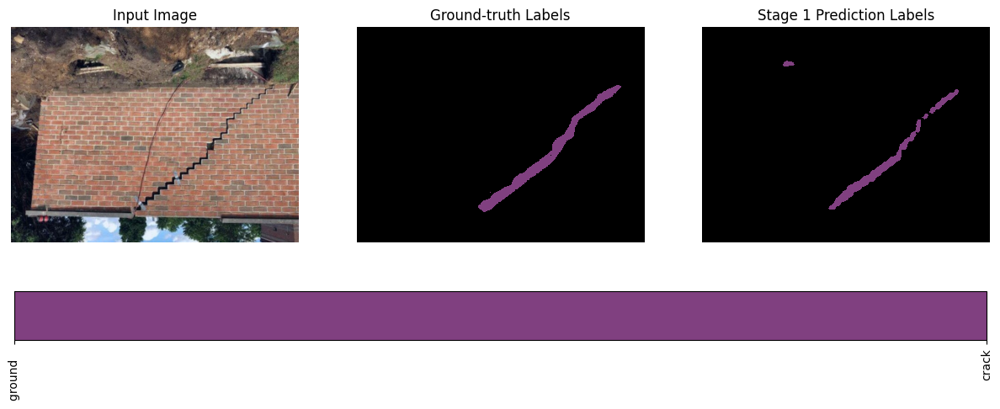

best val iou tensor(0.7217, device='cuda:0')


Train Epoch: [48/50] Loss: 0.0345 mPA: 0.99%  Lr: 0.0006247082    IOU1: 0.8213 : 100%|█| 32/32 [00:20<00:00,  1.53it/s]
Eval Epoch: [48/50] Loss: 0.0498 mPA: 0.98%      IOU1: 0.7110 : 100%|████████████████████| 8/8 [00:15<00:00,  1.88s/it]


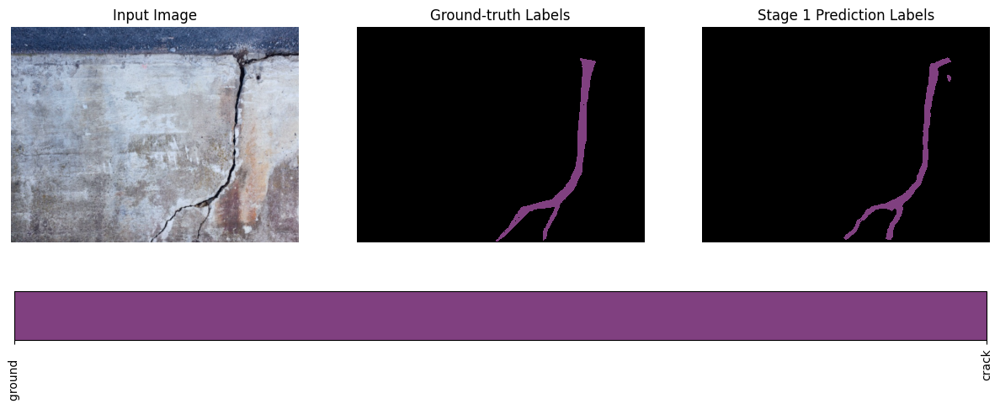

best val iou tensor(0.7217, device='cuda:0')


Train Epoch: [49/50] Loss: 0.0319 mPA: 0.99%  Lr: 0.0006187388    IOU1: 0.8364 : 100%|█| 32/32 [00:21<00:00,  1.51it/s]
Eval Epoch: [49/50] Loss: 0.0622 mPA: 0.98%      IOU1: 0.7174 : 100%|████████████████████| 8/8 [00:13<00:00,  1.67s/it]


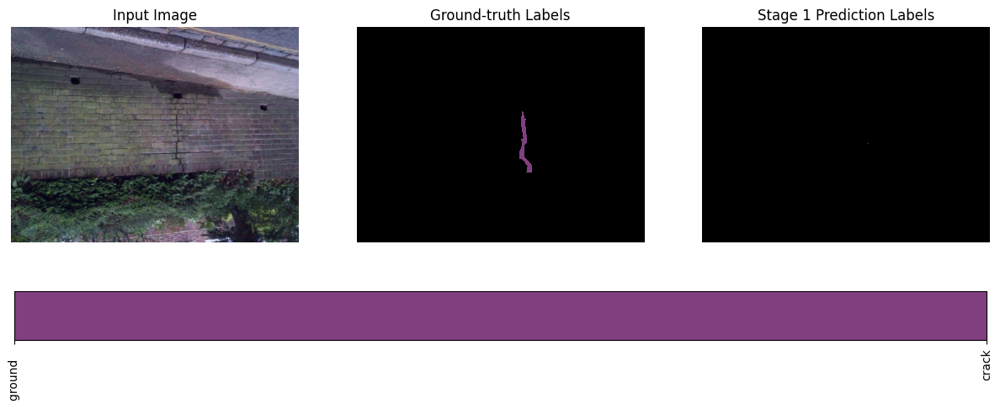

best val iou tensor(0.7217, device='cuda:0')


Train Epoch: [50/50] Loss: 0.0326 mPA: 0.99%  Lr: 0.0006128265    IOU1: 0.8359 : 100%|█| 32/32 [00:20<00:00,  1.54it/s]
Eval Epoch: [50/50] Loss: 0.0587 mPA: 0.98%      IOU1: 0.7057 : 100%|████████████████████| 8/8 [00:13<00:00,  1.66s/it]


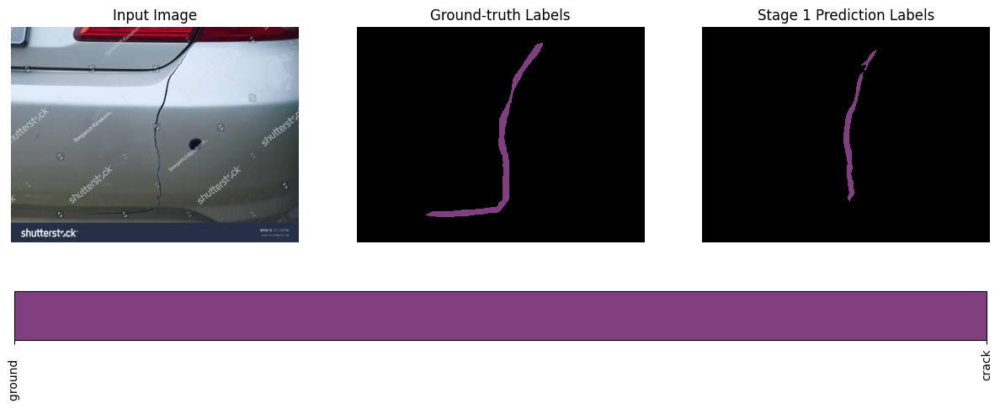

best val iou tensor(0.7217, device='cuda:0')


In [6]:
import torch.nn as nn
import torchvision.models as models
input_path = './images/augment'

batch_size = 2 # Number of samples per batch during training
max_epochs = 50

trans_resize = transforms.Compose([
              transforms.RandomCrop(480), # Crops a random 480x480 region from the image.
              transforms.Resize(240), # Resizes the image to 240x240.
             ])

trans_aug = transforms.Compose([
              transforms.RandomChoice([
                transforms.ColorJitter(brightness=(0.5, 0.7)), # Randomly changes the brightness of the image.
                transforms.ColorJitter(contrast=(0.5, 0.7)), # Randomly changes the contrast.
                transforms.RandomGrayscale(p=1),]), # Randomly converts the image to grayscale.
                transforms.RandomAffine(0, shear=10, scale=(0.8,1.2)), #  Applies random affine transformations (like rotation, shear, scaling
                # Shears the image by 10 degrees. / Scales the image by a factor between 0.8 and 1.2.
          ])


#Normalizes the image tensor by subtracting the mean and dividing by the standard deviation.
#Mean values for each channel (RGB) from pre-trained model statistics
#Standard deviation values for each channel.

#The numbers used below for normalization in models pre-trained on the ImageNet dataset.

#https://stackoverflow.com/questions/58151507/why-pytorch-officially-use-mean-0-485-0-456-0-406-and-std-0-229-0-224-0-2

# why
# It prevents gradients from becoming too large or too small, which could slow down training or cause instability
# Since the pixel values are now centered around zero, it becomes easier for the network's weights to be initialized properly

normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                std=[0.229, 0.224, 0.225])
data_transforms = {
    'train':
    transforms.Compose([
        # trans_aug,
        # trans_resize,
        transforms.ToTensor(),
        normalize
    ]),
    'validation':
    transforms.Compose([
        transforms.ToTensor(),
        normalize
    ]),
}

model = UNet(3, 2)
trainer = Trainer(model, input_path, batch_size, max_epochs, 2)
trainer.train()

In [20]:
filename = 'weights/unet_iou_best.pth'
save_path = os.path.join(input_path, filename)
if os.path.isfile(save_path):
    name, ext = os.path.splitext(save_path)
    assert ext == '.pkl' or '.pth', 'Only .pth and .pkl files supported.'
    print('Resuming training, loading {}...'.format(save_path))
    print(model.load_state_dict(torch.load(save_path, map_location=lambda storage, loc: storage)))

Resuming training, loading ./images/augment\weights/unet_iou_best.pth...


C:\Users\bigda\AppData\Local\Temp\ipykernel_6364\2669284483.py:7: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  print(model.load_state_dict(torch.load(save_path, map_locatio

<All keys matched successfully>


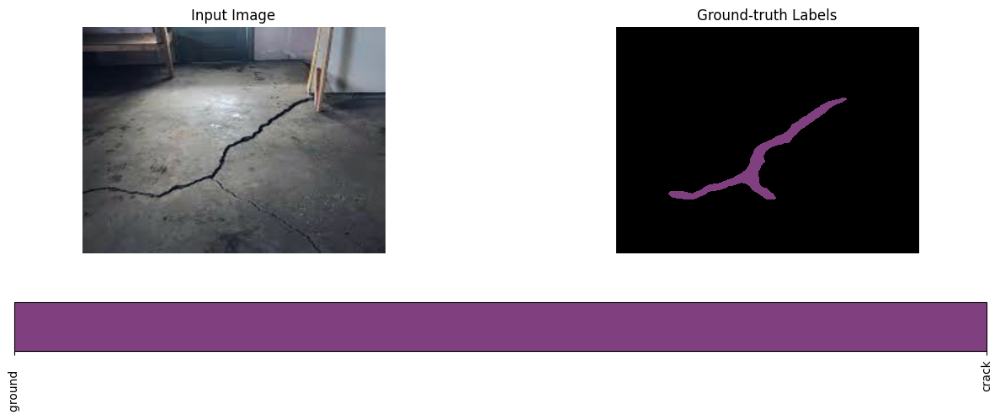

In [24]:
image_path = "./images/augment/img/ccrack20_0.jpg"
image = cv2.imread(image_path, cv2.IMREAD_COLOR)
new_size = (640, 480)
image = cv2.resize(image, new_size)
w,h,_ = image.shape
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
pil_image = Image.fromarray(image.astype('uint8'), 'RGB')
input_tensor = data_transforms['validation'](pil_image)
input_batch = input_tensor.unsqueeze(0)
if torch.cuda.is_available():
    input_batch = input_batch.to('cuda')
    model.to('cuda')
model.eval()
with torch.no_grad():
    output = model(input_batch)[0]
pred = output.argmax(0)
pred = pred.squeeze(0).cpu().data.numpy()
img = input_batch.squeeze(0)
img = img.cpu().numpy()
img = img.transpose(1, 2, 0)
h,w = pred.shape
display([img,  pred.reshape( h, w,1)])